In [1]:
import os
import sys

data_path = os.path.abspath(os.path.join(os.getcwd(), '../..'))
if data_path not in sys.path:
    sys.path.append(data_path)

print("Final sys.path:", sys.path)

Final sys.path: ['/Users/anthonybolton/Developer/FYP/ts-fm-benchmark-financial/test/test_chronos', '/opt/anaconda3/lib/python312.zip', '/opt/anaconda3/lib/python3.12', '/opt/anaconda3/lib/python3.12/lib-dynload', '', '/opt/anaconda3/lib/python3.12/site-packages', '__editable__.lag_llama-0.1.0.finder.__path_hook__', '/opt/anaconda3/lib/python3.12/site-packages/aeosa', '/opt/anaconda3/lib/python3.12/site-packages/setuptools/_vendor', '/Users/anthonybolton/Developer/FYP/ts-fm-benchmark-financial']


In [2]:
pip install git+https://github.com/amazon-science/chronos-forecasting.git

  Cloning https://github.com/amazon-science/chronos-forecasting.git to /private/var/folders/x3/lq5xm_7n0p34sd9k354_nyjh0000gn/T/pip-req-build-7ia02gd8
  Running command git clone --filter=blob:none --quiet https://github.com/amazon-science/chronos-forecasting.git /private/var/folders/x3/lq5xm_7n0p34sd9k354_nyjh0000gn/T/pip-req-build-7ia02gd8
  Resolved https://github.com/amazon-science/chronos-forecasting.git to commit f40a266a550e37ac16cb6c46dd29a6183f39f618
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
Note: you may need to restart the kernel to use updated packages.


# Forecasting visualization function

In [3]:
import matplotlib.pyplot as plt

# ======================
# Finalized Forecasting Plot Function
# ======================

plt.style.use("seaborn-v0_8-whitegrid")
plt.rcParams["figure.dpi"] = 300
plt.rcParams["savefig.dpi"] = 400
plt.rcParams["figure.figsize"] = (14, 8)

custom_palette = {
    "historical": "#333333",           # dark grey 
    "ground_truth": "#0077CC",         # bright blue 
    "forecast": "#FFA500",             # orange
    "prediction_interval": "#FF7F0E",  # bright orange
}


def plot_forecasts(data, start_idx, forecasts, method, historical_window, FORECAST_STEPS):
    """Plot forecasting results with historical data, ground truth, and model predictions."""

    fig, ax = plt.subplots()

    # Historical data (context window before forecast start)
    context_data = data.iloc[start_idx - historical_window : start_idx + 1]
    ax.plot(
        context_data["Date"],
        context_data["Close"],
        label="Historical Data",
        color=custom_palette["historical"],
        linewidth=1.75,
    )

    # Ground truth for the forecast period
    actual_data = data.iloc[start_idx : start_idx + FORECAST_STEPS]
    ax.plot(
        actual_data["Date"],
        actual_data["Close"],
        label="Ground Truth",
        color=custom_palette["ground_truth"],
        linewidth=1.75,
    )

    # Forecast median and uncertainty band
    ax.plot(
        forecasts["dates"],
        forecasts["median"],
        label=f"Prediction",
        color=custom_palette["forecast"],
        linewidth=1.75,
    )
    ax.fill_between(
        forecasts["dates"],
        forecasts["low"],
        forecasts["high"],
        color=custom_palette["forecast"],
        alpha=0.4,
    )

    # Labels and title
    ax.set_xlabel("Time", fontsize=12)
    ax.set_ylabel("Value", fontsize=12)
    ax.set_title(
        f"{method}",
        fontsize=14,
    )

    # Tick formatting
    plt.xticks(rotation=45, fontsize=10)
    plt.yticks(fontsize=10)

    # Legend
    ax.legend(fontsize=10, frameon=True)

    # Grid and layout
    ax.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

# Turn synthetic data into dataframe for feeding into Chronos

In [4]:
import pandas as pd
import numpy as np
from datetime import datetime, timedelta

def convert_synthetic_to_dataframe(synthetic_data):
    """
    Convert synthetic data to a DataFrame with Date and Close columns
    
    Args:
        synthetic_data: Output from generator's generate() method
                      (can be array or tuple with (array, time_features))
    """
    # Handle ARNonstationaryGenerator which returns a tuple of (data, time_features)
    if isinstance(synthetic_data, tuple):
        # Extract just the data array and ignore time features
        series = synthetic_data[0][0]  
    else:
        # For other generators that return just the array
        series = synthetic_data[0]
    
    # Create dates (daily, starting from today going backwards)
    end_date = datetime.now()
    dates = [end_date - timedelta(days=i) for i in range(len(series))]
    dates.reverse()  # So they go from past to present
    
    # Create DataFrame with Date and Close columns
    df = pd.DataFrame({
        'Date': dates,
        'Close': series
    })
    
    return df

## Chronos one-step sliding window

In [5]:
import pandas as pd
import numpy as np
import torch
from chronos import ChronosPipeline
from sklearn.preprocessing import StandardScaler
from utils.metrics import calculate_metrics

# CONTEXT_WINDOW = 100
# FORECAST_STEPS = 21
PREDICTION_INTERVAL_ALPHA = 0.2

# ======================
# Chronos Implementation (Context Scaling)
# ======================
class ChronosPredictor:
    def __init__(self):
        self.scaler = StandardScaler()
        self.pipeline = ChronosPipeline.from_pretrained(
            "amazon/chronos-t5-large",
            device_map="mps",
            torch_dtype=torch.bfloat16,
        )
        
    def generate_single_forecast(self, context_data):
        # Fit scaler on context window
        self.scaler.fit(context_data.reshape(-1, 1))
        scaled_data = self.scaler.transform(context_data.reshape(-1, 1)).flatten()
        context = torch.tensor(scaled_data, dtype=torch.bfloat16)
        
        forecast = self.pipeline.predict(context, 1)
        forecast_np = forecast[0].cpu().numpy()
        
        forecast_original = self.scaler.inverse_transform(forecast_np.reshape(-1, 1))
        return (
            np.quantile(forecast_original, 0.1).item(),
            np.quantile(forecast_original, 0.5).item(),
            np.quantile(forecast_original, 0.9).item()
        )

    def sliding_window_forecast(self, full_data, start_idx, CONTEXT_WINDOW, FORECAST_STEPS):
        forecasts = {'median': [], 'low': [], 'high': [], 'dates': []}
        
        for i in range(FORECAST_STEPS):
            current_idx = start_idx + i
            context_start = current_idx - CONTEXT_WINDOW
            context_data = full_data['Close'].iloc[context_start:current_idx].values
            
            low, median, high = self.generate_single_forecast(context_data)
            forecasts['dates'].append(full_data['Date'].iloc[current_idx])
            forecasts['median'].append(median)
            forecasts['low'].append(low)
            forecasts['high'].append(high)
            
        return forecasts

# ======================
# Multiple Trials Comparison (Chronos Only)
# ======================
def run_multiple_trials_comparison(full_data, n_trials=10, test_start=None, CONTEXT_WINDOW=None, FORECAST_STEPS=None):
    """Run trials for Chronos model with consistent context window scaling approach."""
    
    # Actual data over the forecast horizon
    actual = full_data['Close'].iloc[test_start : test_start + FORECAST_STEPS].values

    # Get the last historical point for directional accuracy calculation
    historical_last_point = float(full_data['Close'].iloc[test_start - 1]) if test_start > 0 else None

    # In-sample data (used for metric calculation)
    insample_data = full_data['Close'].iloc[test_start - CONTEXT_WINDOW : test_start].values
    
    # Chronos Context Window Scaling
    chronos_context = ChronosPredictor()
    chronos_context_metrics_list = []
    chronos_context_preds = None
    
    for trial in range(n_trials):
        chronos_context_preds = chronos_context.sliding_window_forecast(full_data, test_start, CONTEXT_WINDOW, FORECAST_STEPS)
        
        # Ensure predictions align with actual values
        if len(chronos_context_preds['median']) != len(actual):
            print(f"Warning: Chronos prediction length ({len(chronos_context_preds['median'])}) doesn't match actual data length ({len(actual)})")
            min_length = min(len(chronos_context_preds['median']), len(actual))
            chronos_actual = actual[:min_length]
            chronos_preds = chronos_context_preds['median'][:min_length]
        else:
            chronos_actual = actual
            chronos_preds = chronos_context_preds['median']
        
        chronos_metrics = calculate_metrics(
            chronos_actual, 
            chronos_preds, 
            insample=insample_data,
            historical_last_point=historical_last_point,
            directional_accuracy=True
        )
        
        chronos_context_metrics_list.append(chronos_metrics)
        
        print(f"\nTrial {trial+1}/{n_trials}")
        print("Context scaling metrics:", chronos_metrics)
    
    # Average & std for Chronos Context
    chronos_context_avg = {
        metric: np.mean([m[metric] for m in chronos_context_metrics_list]) 
        for metric in chronos_context_metrics_list[0]
    }
    chronos_context_std = {
        metric: np.std([m[metric] for m in chronos_context_metrics_list]) 
        for metric in chronos_context_metrics_list[0]
    }
    
    return (
        chronos_context_avg,
        chronos_context_std,
        chronos_context_preds
    )

# 1. Stationary: Simple Sine Wave


Trial 1/5
Context scaling metrics: {'MAE': 0.004032113830887822, 'MSE': 2.1521785256682544e-05, 'RMSE': 0.004639157817608983, 'Z-NormalizedMAE': 0.005167577416983581, 'Z-NormalizedMSE': 3.5349779452543535e-05, 'Z-NormalizedRMSE': 0.005945568051291947, 'MAPE': 1.0609735389877795, 'SMAPE': 1.059414666028648, 'MASE': 0.018618667028624657, 'DirectionalAccuracy': 100.0}

Trial 2/5
Context scaling metrics: {'MAE': 0.00420025153912401, 'MSE': 2.218883373895408e-05, 'RMSE': 0.004710502493254205, 'Z-NormalizedMAE': 0.005383063551667776, 'Z-NormalizedMSE': 3.644541424543931e-05, 'Z-NormalizedRMSE': 0.006037003747343487, 'MAPE': 1.078258312822423, 'SMAPE': 1.0766427699143108, 'MASE': 0.019395058801253837, 'DirectionalAccuracy': 100.0}

Trial 3/5
Context scaling metrics: {'MAE': 0.004153752719292305, 'MSE': 2.195127901918322e-05, 'RMSE': 0.004685219207164508, 'Z-NormalizedMAE': 0.005323470429708271, 'Z-NormalizedMSE': 3.605522789000193e-05, 'Z-NormalizedRMSE': 0.0060046005604038255, 'MAPE': 1.073

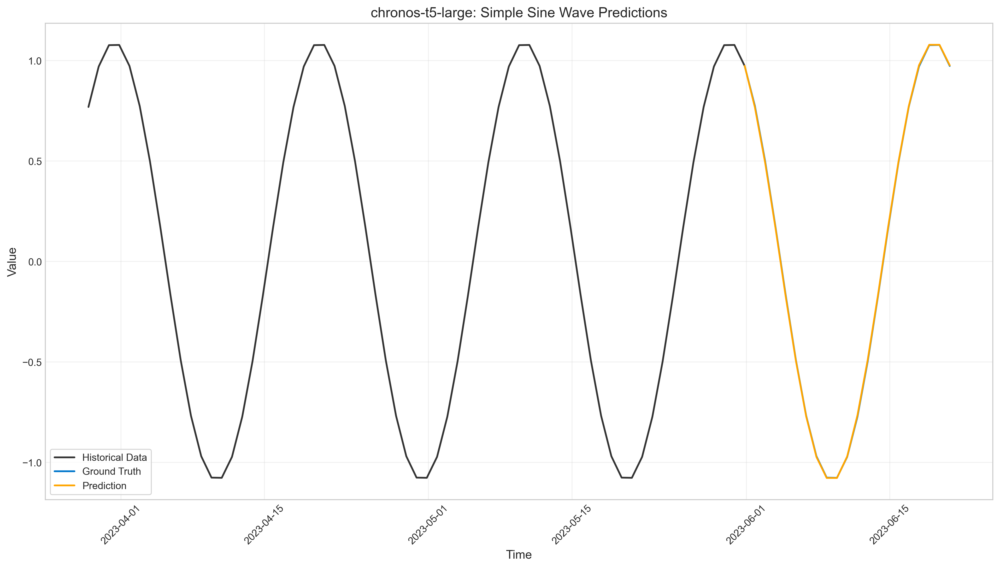

In [9]:
from data.synthetic.stationary import SineWaveGenerator

sine_gen = SineWaveGenerator(
    seq_length=2000,
    num_samples=1,
    freq=0.05,
    amplitude=1.0
)
sine_data = sine_gen.generate()

sine_df = convert_synthetic_to_dataframe(sine_data)

# Select test start date
test_date_str = "2023-06-01"
test_date = pd.Timestamp(test_date_str)
date_indices_sinedf = sine_df[sine_df['Date'] <= test_date].index
test_start = date_indices_sinedf[-1]

# Run Chronos comparison
sinedf_chronos_context_avg, sinedf_chronos_context_std, sinedf_chronos_context_preds = run_multiple_trials_comparison(
    sine_df, 
    n_trials=5, 
    test_start=test_start,
    CONTEXT_WINDOW=64,
    FORECAST_STEPS=21
)

print("\nChronos T5 Context Scaling Metrics (Average ± Std):")
for metric in sinedf_chronos_context_avg:
    print(f"{metric}: {sinedf_chronos_context_avg[metric]:.4f} ± {sinedf_chronos_context_std[metric]:.4f}")

plot_forecasts(sine_df, test_start, sinedf_chronos_context_preds, "chronos-t5-large: Simple Sine Wave Predictions", historical_window=64, FORECAST_STEPS=21)

## Note: choosing a good context window length matters, with wrong window length, even sine wave cannot be predicted optimally. Below we perform one-step predictions with context window of length 10, which is still context window > prediction window, but perfomance degrades:


Trial 1/5
Context scaling metrics: {'MAE': 0.09793014319995735, 'MSE': 0.013544354920502539, 'RMSE': 0.11638021704955932, 'Z-NormalizedMAE': 0.12451858668170755, 'Z-NormalizedMSE': 0.021897468581206295, 'Z-NormalizedRMSE': 0.1479779327508203, 'MAPE': 27.343207418218572, 'SMAPE': 29.464051747333357, 'MASE': 0.409286456746001, 'DirectionalAccuracy': 94.44444444444444}

Trial 2/5
Context scaling metrics: {'MAE': 0.08432907242567995, 'MSE': 0.011482411962850348, 'RMSE': 0.10715601692322436, 'Z-NormalizedMAE': 0.10722476830432733, 'Z-NormalizedMSE': 0.018563878211163544, 'Z-NormalizedRMSE': 0.13624932370901346, 'MAPE': 23.403474360853778, 'SMAPE': 26.36853693929434, 'MASE': 0.3524425281734753, 'DirectionalAccuracy': 94.44444444444444}

Trial 3/5
Context scaling metrics: {'MAE': 0.09189835733007512, 'MSE': 0.013057306012176584, 'RMSE': 0.11426856966015013, 'Z-NormalizedMAE': 0.11684914571958346, 'Z-NormalizedMSE': 0.021110045464330183, 'Z-NormalizedRMSE': 0.1452929642630027, 'MAPE': 27.7843

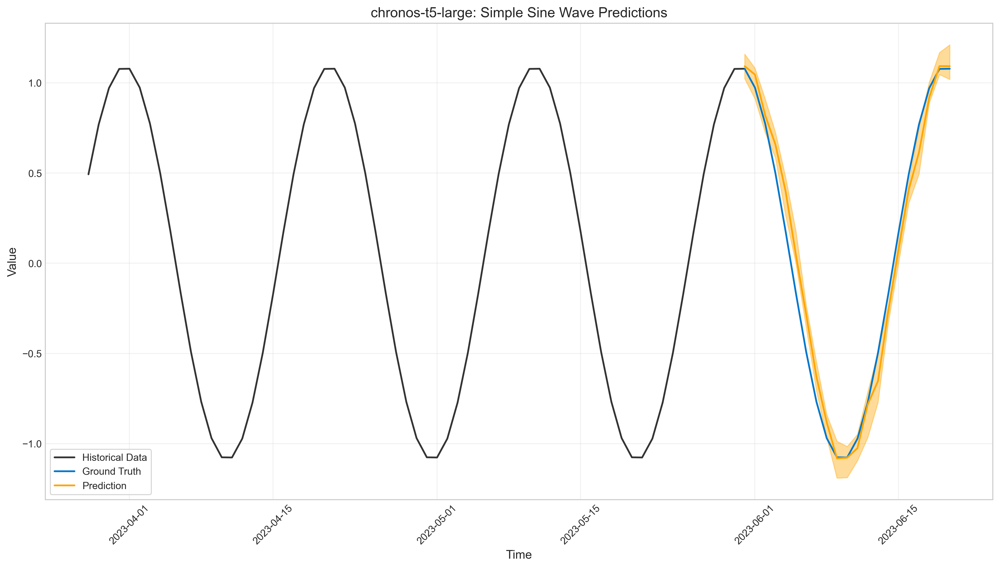

In [21]:
from data.synthetic.stationary import SineWaveGenerator

sine_gen = SineWaveGenerator(
    seq_length=2000,
    num_samples=1,
    freq=0.05,
    amplitude=1.0
)
sine_data = sine_gen.generate()

sine_df = convert_synthetic_to_dataframe(sine_data)

# Select test start date
test_date_str = "2023-06-01"
test_date = pd.Timestamp(test_date_str)
date_indices_sinedf = sine_df[sine_df['Date'] <= test_date].index
test_start = date_indices_sinedf[-1]

# Run Chronos comparison
sinedf_chronos_context_avg, sinedf_chronos_context_std, sinedf_chronos_context_preds = run_multiple_trials_comparison(
    sine_df, 
    n_trials=5, 
    test_start=test_start,
    CONTEXT_WINDOW=10,
    FORECAST_STEPS=21
)

print("\nChronos T5 Context Scaling Metrics (Average ± Std):")
for metric in sinedf_chronos_context_avg:
    print(f"{metric}: {sinedf_chronos_context_avg[metric]:.4f} ± {sinedf_chronos_context_std[metric]:.4f}")

plot_forecasts(sine_df, test_start, sinedf_chronos_context_preds, "chronos-t5-large: Simple Sine Wave Predictions", historical_window=64, FORECAST_STEPS=21)

# 2. Stationary: Composite Sine Wave


Trial 1/5
Context scaling metrics: {'MAE': 0.023056696341321382, 'MSE': 0.0009729395458202349, 'RMSE': 0.031191978869899148, 'Z-NormalizedMAE': 0.030546348282449308, 'Z-NormalizedMSE': 0.0017076949514369744, 'Z-NormalizedRMSE': 0.04132426589108359, 'MAPE': 9.58599432775722, 'SMAPE': 12.914937785327652, 'MASE': 0.05665397792735815, 'DirectionalAccuracy': 100.0}

Trial 2/5
Context scaling metrics: {'MAE': 0.024357521465642875, 'MSE': 0.0010126003025761807, 'RMSE': 0.03182138121729132, 'Z-NormalizedMAE': 0.03226972862774501, 'Z-NormalizedMSE': 0.0017773071635967753, 'Z-NormalizedRMSE': 0.04215812096852486, 'MAPE': 12.242284115956895, 'SMAPE': 13.298269031884038, 'MASE': 0.05985031259689126, 'DirectionalAccuracy': 96.66666666666667}

Trial 3/5
Context scaling metrics: {'MAE': 0.028793551042802956, 'MSE': 0.0013319301529776707, 'RMSE': 0.036495618270933165, 'Z-NormalizedMAE': 0.038146741641631655, 'Z-NormalizedMSE': 0.0023377921142974066, 'Z-NormalizedRMSE': 0.048350719894303604, 'MAPE': 1

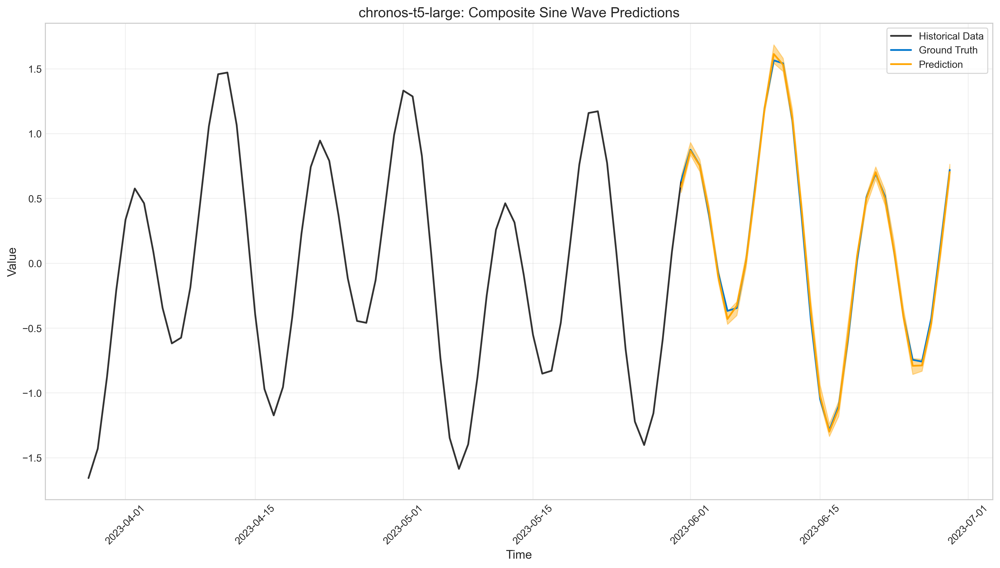

In [18]:
from data.synthetic.stationary import CompositeSineGenerator

comp_sine_gen = CompositeSineGenerator(
    seq_length=2000,
    num_samples=1,
    frequencies=[0.1, 0.05, 0.02],
    amplitudes=[1.0, 0.5, 0.25]
)
comp_sine_data = comp_sine_gen.generate()

comp_sine_df = convert_synthetic_to_dataframe(comp_sine_data)

# Select test start date
test_date_str = "2023-06-01"
test_date = pd.Timestamp(test_date_str)
date_indices_compsinedf = comp_sine_df[comp_sine_df['Date'] <= test_date].index
test_start = date_indices_compsinedf[-1]

# Run Chronos comparison
compsinedf_chronos_context_avg, compsinedf_chronos_context_std, compsinedf_chronos_context_preds = run_multiple_trials_comparison(
    comp_sine_df, 
    n_trials=5, 
    test_start=test_start,
    CONTEXT_WINDOW=65,
    FORECAST_STEPS=30
)

print("\nChronos T5 Context Scaling Metrics (Average ± Std):")
for metric in compsinedf_chronos_context_avg:
    print(f"{metric}: {compsinedf_chronos_context_avg[metric]:.4f} ± {compsinedf_chronos_context_std[metric]:.4f}")

plot_forecasts(comp_sine_df, test_start, compsinedf_chronos_context_preds, "chronos-t5-large: Composite Sine Wave Predictions", historical_window=64, FORECAST_STEPS=30)

## 3. Linear Trend


Trial 1/5
Context scaling metrics: {'MAE': 0.08831841864398851, 'MSE': 0.011463837788398708, 'RMSE': 0.1070693130098382, 'Z-NormalizedMAE': 0.12759389401012236, 'Z-NormalizedMSE': 0.023926944768873765, 'Z-NormalizedRMSE': 0.15468336939979607, 'MAPE': 0.6479521523476625, 'SMAPE': 0.6487662290244608, 'MASE': 0.4182598145775744, 'DirectionalAccuracy': 86.66666666666667}

Trial 2/5
Context scaling metrics: {'MAE': 0.08772511860961364, 'MSE': 0.01186508383767524, 'RMSE': 0.10892696561308976, 'Z-NormalizedMAE': 0.12673675160580258, 'Z-NormalizedMSE': 0.024764412311330107, 'Z-NormalizedRMSE': 0.15736712589143292, 'MAPE': 0.6454150708867424, 'SMAPE': 0.646031973068982, 'MASE': 0.41545005455042977, 'DirectionalAccuracy': 83.33333333333334}

Trial 3/5
Context scaling metrics: {'MAE': 0.09154494269295792, 'MSE': 0.01315493961207944, 'RMSE': 0.1146949851217543, 'Z-NormalizedMAE': 0.13225526333541354, 'Z-NormalizedMSE': 0.02745655681334099, 'Z-NormalizedRMSE': 0.1657002016092346, 'MAPE': 0.6693498

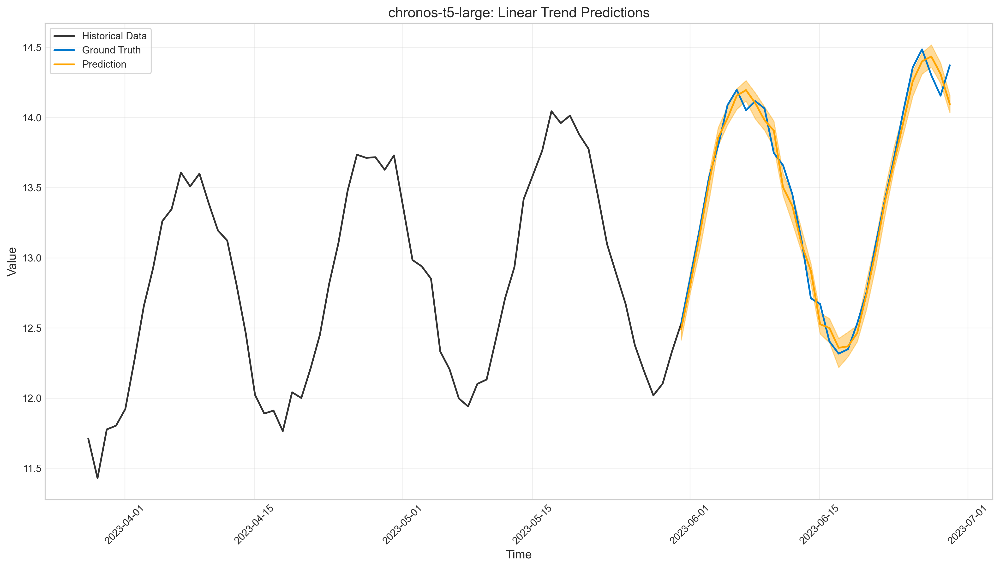

In [22]:
from data.synthetic.nonstationary import TrendGenerator

linear_trend_gen = TrendGenerator(
    seq_length=2000,
    num_samples=1,
    trend_type="linear",
    seasonal_amplitude=1.0,
    trend_coefficient=0.01,
    seed=42,
)
linear_trend_data = linear_trend_gen.generate()

linear_trend_df = convert_synthetic_to_dataframe(linear_trend_data)

# Select test start date
test_date_str = "2023-06-01"
test_date = pd.Timestamp(test_date_str)
date_indices_lineartrendf = linear_trend_df[linear_trend_df['Date'] <= test_date].index
test_start = date_indices_lineartrendf[-1]

# Run Chronos comparison
lineartrend_df_chronos_avg, lineartrend_df_chronos_std, lineartrend_df_chronos_preds = run_multiple_trials_comparison(
    linear_trend_df, 
    n_trials=5, 
    test_start=test_start,
    CONTEXT_WINDOW=70,
    FORECAST_STEPS=30
)

print("\nChronos T5 Context Scaling Metrics (Average ± Std):")
for metric in lineartrend_df_chronos_avg:
    print(f"{metric}: {lineartrend_df_chronos_avg[metric]:.4f} ± {lineartrend_df_chronos_std[metric]:.4f}")

plot_forecasts(linear_trend_df, test_start, lineartrend_df_chronos_preds, "chronos-t5-large: Linear Trend Predictions", historical_window=64, FORECAST_STEPS=30)

## 4. Exponential Trend

                          Date     Close
0   2024-09-25 00:56:54.842993  0.049671
1   2024-09-26 00:56:54.842993  0.305241
2   2024-09-27 00:56:54.842993  0.672755
3   2024-09-28 00:56:54.842993  0.991775
4   2024-09-29 00:56:54.842993  0.968452
..                         ...       ...
195 2025-04-08 00:56:54.842993  5.067219
196 2025-04-09 00:56:54.842993  5.059885
197 2025-04-10 00:56:54.842993  5.377032
198 2025-04-11 00:56:54.842993  5.660779
199 2025-04-12 00:56:54.842993  5.892220

[200 rows x 2 columns]
129

Trial 1/5
Context scaling metrics: {'MAE': 0.12310167093331664, 'MSE': 0.0225181333672304, 'RMSE': 0.15006043238385794, 'Z-NormalizedMAE': 0.16377419482130498, 'Z-NormalizedMSE': 0.039856158477112345, 'Z-NormalizedRMSE': 0.19964007232294909, 'MAPE': 4.272330557628126, 'SMAPE': 4.331625331341229, 'MASE': 0.5295760185140126, 'DirectionalAccuracy': 83.33333333333334}

Trial 2/5
Context scaling metrics: {'MAE': 0.1188312496003971, 'MSE': 0.021089834267781975, 'RMSE': 0.145223394

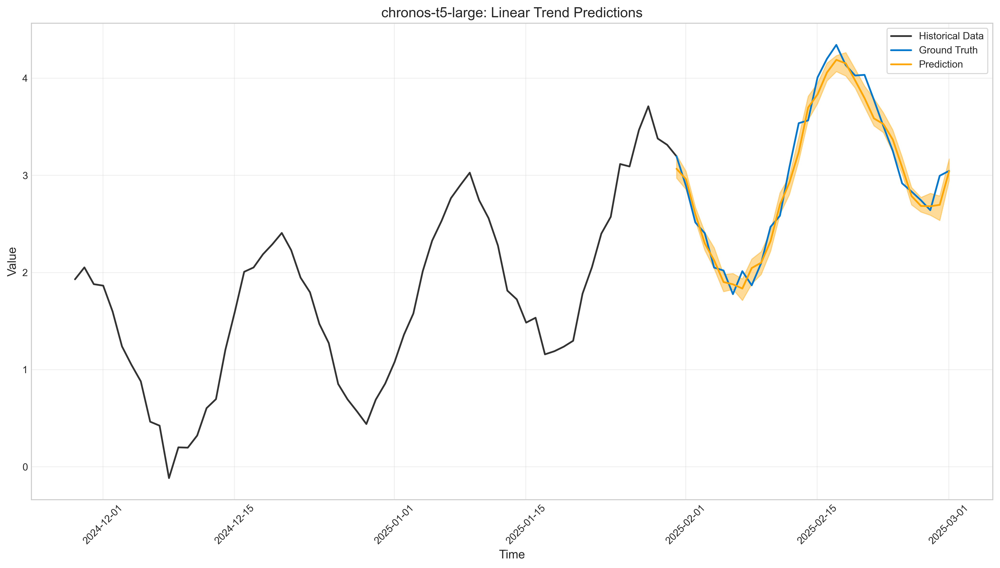

In [34]:
from data.synthetic.nonstationary import TrendGenerator

expo_trend_gen = TrendGenerator(
    seq_length=200,
    num_samples=1,
    trend_type="exponential",
    seasonal_amplitude=1.0,
    trend_coefficient=0.01,
    seed=42,
)
expo_trend_data = expo_trend_gen.generate()
# print(expo_trend_data)
expo_trend_df = convert_synthetic_to_dataframe(expo_trend_data)
print(expo_trend_df)
# Select test start date
test_date_str = "2025-02-01"
test_date = pd.Timestamp(test_date_str)
date_indices_expotrendf = expo_trend_df[expo_trend_df['Date'] <= test_date].index
print(len(date_indices_expotrendf))
test_start = date_indices_expotrendf[-1]

# Run Chronos comparison
expotrend_df_chronos_avg, expotrend_df_chronos_std, expotrend_df_chronos_preds = run_multiple_trials_comparison(
    expo_trend_df, 
    n_trials=5, 
    test_start=test_start,
    CONTEXT_WINDOW=70,
    FORECAST_STEPS=30
)

print("\nChronos T5 Context Scaling Metrics (Average ± Std):")
for metric in expotrend_df_chronos_avg:
    print(f"{metric}: {expotrend_df_chronos_avg[metric]:.4f} ± {expotrend_df_chronos_std[metric]:.4f}")

plot_forecasts(expo_trend_df, test_start, expotrend_df_chronos_preds, "chronos-t5-large: Linear Trend Predictions", historical_window=64, FORECAST_STEPS=30)

## 5. Changing Patterns


Trial 1/5
Context scaling metrics: {'MAE': 0.20940883987013226, 'MSE': 0.09540363726777895, 'RMSE': 0.30887479221810726, 'Z-NormalizedMAE': 0.2853758495273889, 'Z-NormalizedMSE': 0.1771778166478777, 'Z-NormalizedRMSE': 0.4209249537006302, 'MAPE': 493.07627122595886, 'SMAPE': 52.86704090973217, 'MASE': 0.6290451280263903, 'DirectionalAccuracy': 73.33333333333333}

Trial 2/5
Context scaling metrics: {'MAE': 0.2103282808809089, 'MSE': 0.0928684093708621, 'RMSE': 0.30474318593015676, 'Z-NormalizedMAE': 0.2866288351210412, 'Z-NormalizedMSE': 0.17246954601643688, 'Z-NormalizedRMSE': 0.41529452923971544, 'MAPE': 469.77493035746767, 'SMAPE': 50.48519042336994, 'MASE': 0.631807045282106, 'DirectionalAccuracy': 76.66666666666667}

Trial 3/5
Context scaling metrics: {'MAE': 0.21440904594543053, 'MSE': 0.09683389990674221, 'RMSE': 0.3111814581666816, 'Z-NormalizedMAE': 0.29218997474500247, 'Z-NormalizedMSE': 0.17983401319197034, 'Z-NormalizedRMSE': 0.42406840626480335, 'MAPE': 501.54112279479284,

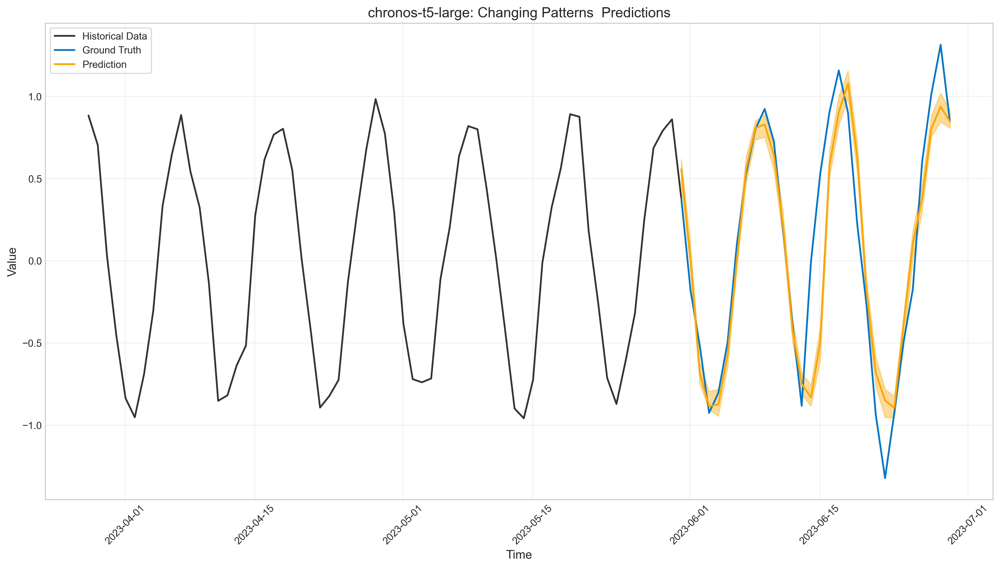

In [33]:
from data.synthetic.nonstationary import ChangingPatternGenerator

cp_gen = ChangingPatternGenerator(
    seq_length=2000,
    num_samples=1,
    change_points=2,
    seed=42,
)
cp_data = cp_gen.generate()

cp_df = convert_synthetic_to_dataframe(cp_data)

# Select test start date
test_date_str = "2023-06-01"
test_date = pd.Timestamp(test_date_str)
date_indices_cpdf = cp_df[cp_df['Date'] <= test_date].index
test_start = date_indices_cpdf[-1]

# Run Chronos comparison
cp_df_chronos_avg, cp_df_chronos_std, cp_df_chronos_preds = run_multiple_trials_comparison(
    cp_df, 
    n_trials=5, 
    test_start=test_start,
    CONTEXT_WINDOW=120,
    FORECAST_STEPS=30
)

print("\nChronos T5 Context Scaling Metrics (Average ± Std):")
for metric in cp_df_chronos_avg:
    print(f"{metric}: {cp_df_chronos_avg[metric]:.4f} ± {cp_df_chronos_std[metric]:.4f}")

plot_forecasts(cp_df, test_start, cp_df_chronos_preds, "chronos-t5-large: Changing Patterns  Predictions", historical_window=64, FORECAST_STEPS=30)

## 6. Non-stationary


Trial 1/5
Context scaling metrics: {'MAE': 3.062013347351022, 'MSE': 16.281025737761347, 'RMSE': 4.0349753081972315, 'Z-NormalizedMAE': 0.764985562400422, 'Z-NormalizedMSE': 1.0161880453701522, 'Z-NormalizedRMSE': 1.0080615285636845, 'MAPE': 130.81979636924322, 'SMAPE': 143.19958224495824, 'MASE': 0.5658473234691409, 'DirectionalAccuracy': 53.333333333333336}

Trial 2/5
Context scaling metrics: {'MAE': 3.029040703341047, 'MSE': 16.031852853977867, 'RMSE': 4.003979627068283, 'Z-NormalizedMAE': 0.7567479769425987, 'Z-NormalizedMSE': 1.0006358000872333, 'Z-NormalizedRMSE': 1.000317849529455, 'MAPE': 139.1541754538229, 'SMAPE': 144.0292479963492, 'MASE': 0.5597541160777081, 'DirectionalAccuracy': 60.0}

Trial 3/5
Context scaling metrics: {'MAE': 3.090115322573451, 'MSE': 16.395530552511975, 'RMSE': 4.049139482965729, 'Z-NormalizedMAE': 0.7720063042723313, 'Z-NormalizedMSE': 1.0233349184088107, 'Z-NormalizedRMSE': 1.0116001771494558, 'MAPE': 150.4921842304318, 'SMAPE': 147.3652209913127, '

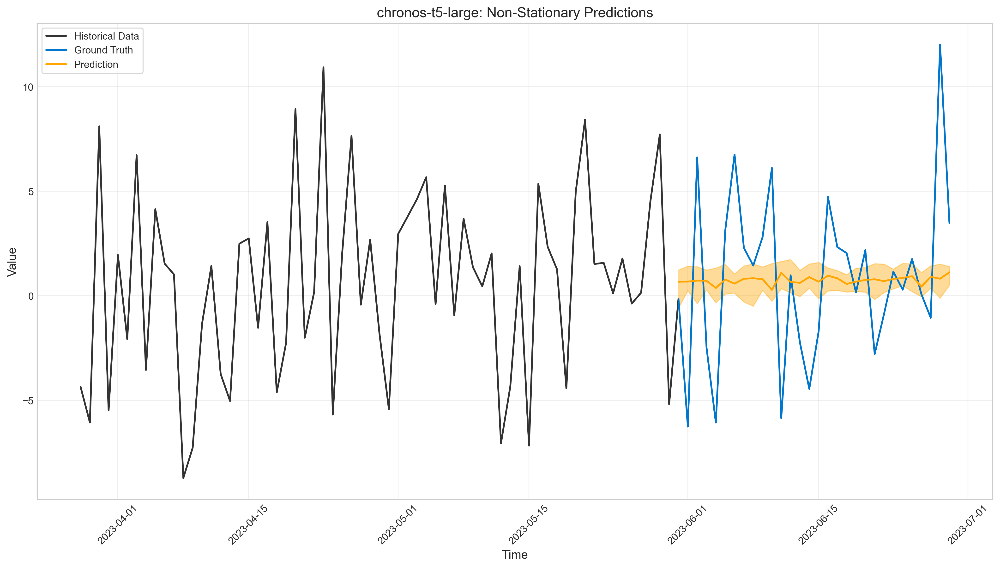

In [16]:
from data.synthetic.nonstationary import ARNonstationaryGenerator

nonstationary_gen = ARNonstationaryGenerator(
    seq_length=900,
    num_samples=1,
    seed=42,
)
nonstationary_data = nonstationary_gen.generate()

nonstationary_df = convert_synthetic_to_dataframe(nonstationary_data)

# Select test start date
test_date_str = "2023-06-01"
test_date = pd.Timestamp(test_date_str)
date_indices_nonstationarydf = nonstationary_df[nonstationary_df['Date'] <= test_date].index
test_start = date_indices_nonstationarydf[-1]

# Run Chronos comparison
nonstationary_df_chronos_avg, nonstationary_df_chronos_std, nonstationary_df_chronos_preds = run_multiple_trials_comparison(
    nonstationary_df, 
    n_trials=5, 
    test_start=test_start,
    CONTEXT_WINDOW=120,
    FORECAST_STEPS=30
)

print("\nChronos T5 Context Scaling Metrics (Average ± Std):")
for metric in nonstationary_df_chronos_avg:
    print(f"{metric}: {nonstationary_df_chronos_avg[metric]:.4f} ± {nonstationary_df_chronos_std[metric]:.4f}")

plot_forecasts(nonstationary_df, test_start, nonstationary_df_chronos_preds, "chronos-t5-large: Non-Stationary Predictions", historical_window=64, FORECAST_STEPS=30)

# Noise


## 7. Gaussian Noise


Trial 1/5
Context scaling metrics: {'MAE': 0.7032053724733291, 'MSE': 0.9013994699478967, 'RMSE': 0.9494205969684335, 'Z-NormalizedMAE': 0.7475883902175461, 'Z-NormalizedMSE': 1.0187744268893224, 'Z-NormalizedRMSE': 1.0093435623658193, 'MAPE': 193.31412968007305, 'SMAPE': 155.98885227817755, 'MASE': 0.6285492967434949, 'DirectionalAccuracy': 56.666666666666664}

Trial 2/5
Context scaling metrics: {'MAE': 0.7049304314552071, 'MSE': 0.8976122375621443, 'RMSE': 0.9474240009426319, 'Z-NormalizedMAE': 0.7494223268138445, 'Z-NormalizedMSE': 1.0144940432947829, 'Z-NormalizedRMSE': 1.007220950583725, 'MAPE': 212.23368797833174, 'SMAPE': 159.48989153880711, 'MASE': 0.6300912141581568, 'DirectionalAccuracy': 46.666666666666664}

Trial 3/5
Context scaling metrics: {'MAE': 0.7088187765924456, 'MSE': 0.8934372172106854, 'RMSE': 0.945218079181035, 'Z-NormalizedMAE': 0.7535560860192587, 'Z-NormalizedMSE': 1.0097753762580088, 'Z-NormalizedRMSE': 1.0048758014093129, 'MAPE': 255.52098025329494, 'SMAPE'

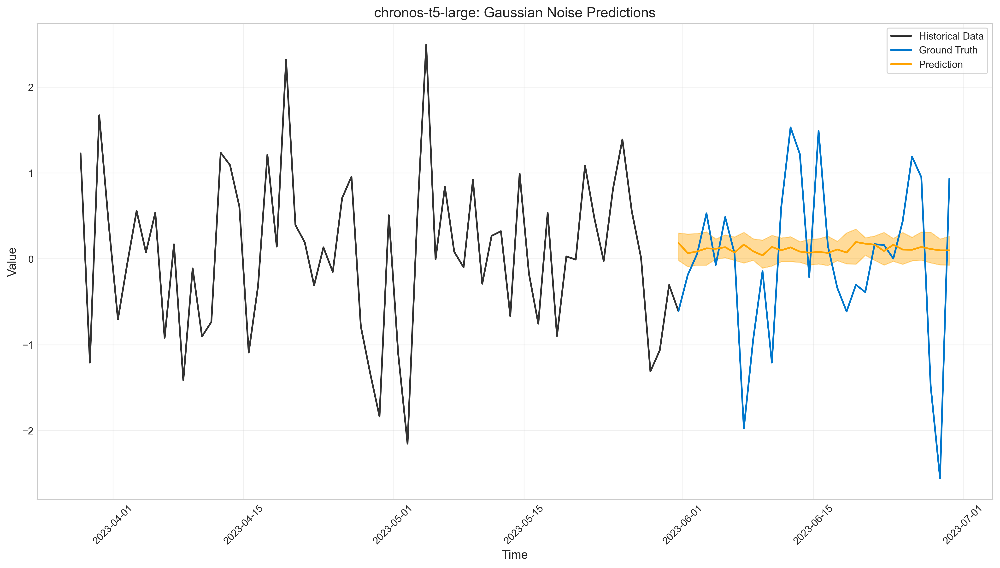

In [9]:
from data.synthetic.noise import NoiseGenerator

gaussian_gen = NoiseGenerator(
    seq_length=2000,
    num_samples=1,
    noise_type="gaussian",
    noise_params={
        "mean": 0.0,
        "std": 1.0,
    },
    seed=42,
)
gaussian_data = gaussian_gen.generate()

gaussian_df = convert_synthetic_to_dataframe(gaussian_data)

# Select test start date
test_date_str = "2023-06-01"
test_date = pd.Timestamp(test_date_str)
date_indices_gaussiandf = gaussian_df[gaussian_df['Date'] <= test_date].index
test_start = date_indices_gaussiandf[-1]

# Run Chronos comparison
gaussian_df_chronos_avg, gaussian_df_chronos_std, gaussian_df_chronos_preds = run_multiple_trials_comparison(
    gaussian_df, 
    n_trials=5, 
    test_start=test_start,
    CONTEXT_WINDOW=500,
    FORECAST_STEPS=30
)

print("\nChronos T5 Context Scaling Metrics (Average ± Std):")
for metric in gaussian_df_chronos_avg:
    print(f"{metric}: {gaussian_df_chronos_avg[metric]:.4f} ± {gaussian_df_chronos_std[metric]:.4f}")

plot_forecasts(gaussian_df, test_start, gaussian_df_chronos_preds, "chronos-t5-large: Gaussian Noise Predictions", historical_window=64, FORECAST_STEPS=30)

## 8. Pink Noise


Trial 1/5
Context scaling metrics: {'MAE': 0.03716997771158757, 'MSE': 0.0026819672295384594, 'RMSE': 0.05178771311361856, 'Z-NormalizedMAE': 0.6621967910371914, 'Z-NormalizedMSE': 0.8512223328543777, 'Z-NormalizedRMSE': 0.9226171106447016, 'MAPE': 16519.5498440956, 'SMAPE': 92.10515973072614, 'MASE': 0.8628317551120734, 'DirectionalAccuracy': 43.333333333333336}

Trial 2/5
Context scaling metrics: {'MAE': 0.03607668546350676, 'MSE': 0.0025566388336363518, 'RMSE': 0.05056321621135618, 'Z-NormalizedMAE': 0.6427193884957512, 'Z-NormalizedMSE': 0.8114446918907898, 'Z-NormalizedRMSE': 0.9008022490484745, 'MAPE': 16390.29908116778, 'SMAPE': 88.30434951030584, 'MASE': 0.8374530132526745, 'DirectionalAccuracy': 46.666666666666664}

Trial 3/5
Context scaling metrics: {'MAE': 0.036668088424748536, 'MSE': 0.002628631012609046, 'RMSE': 0.05127017663914418, 'Z-NormalizedMAE': 0.6532554492430276, 'Z-NormalizedMSE': 0.8342940950667386, 'Z-NormalizedRMSE': 0.9133970084616758, 'MAPE': 16642.917086216

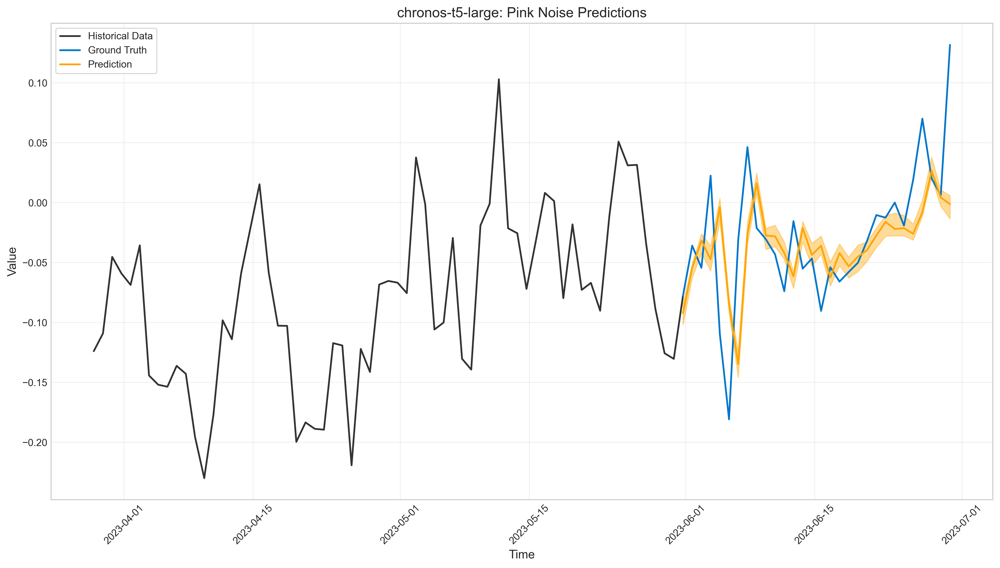

In [25]:
from data.synthetic.noise import NoiseGenerator

pink_gen = NoiseGenerator(
    seq_length=2000,
    num_samples=1,
    noise_type="pink",
    seed=42,
)
pink_data = pink_gen.generate()

pink_df = convert_synthetic_to_dataframe(pink_data)

# Select test start date
test_date_str = "2023-06-01"
test_date = pd.Timestamp(test_date_str)
date_indices_pinkdf = pink_df[pink_df['Date'] <= test_date].index
test_start = date_indices_pinkdf[-1]

# Run Chronos comparison
pink_df_chronos_avg, pink_df_chronos_std, pink_df_chronos_preds = run_multiple_trials_comparison(
    pink_df, 
    n_trials=5, 
    test_start=test_start,
    CONTEXT_WINDOW=500,
    FORECAST_STEPS=30
)

print("\nChronos T5 Context Scaling Metrics (Average ± Std):")
for metric in pink_df_chronos_avg:
    print(f"{metric}: {pink_df_chronos_avg[metric]:.4f} ± {pink_df_chronos_std[metric]:.4f}")

plot_forecasts(pink_df, test_start, pink_df_chronos_preds, "chronos-t5-large: Pink Noise Predictions", historical_window=64, FORECAST_STEPS=30)

## 9. Brownian Noise


Trial 1/5
Context scaling metrics: {'MAE': 0.06465349108416302, 'MSE': 0.007476681646018454, 'RMSE': 0.08646780699207338, 'Z-NormalizedMAE': 0.49540410415907693, 'Z-NormalizedMSE': 0.43897938783178214, 'Z-NormalizedRMSE': 0.6625551960642843, 'MAPE': 1.2836480969046176, 'SMAPE': 1.283470833950879, 'MASE': 0.852977244632005, 'DirectionalAccuracy': 58.620689655172406}

Trial 2/5
Context scaling metrics: {'MAE': 0.06532503572689713, 'MSE': 0.007811596763072062, 'RMSE': 0.08838323802097353, 'Z-NormalizedMAE': 0.5005497810058762, 'Z-NormalizedMSE': 0.4586433029241273, 'Z-NormalizedRMSE': 0.6772320894081492, 'MAPE': 1.296807492526634, 'SMAPE': 1.297400228991477, 'MASE': 0.8618369719166626, 'DirectionalAccuracy': 65.51724137931035}

Trial 3/5
Context scaling metrics: {'MAE': 0.06529286130122083, 'MSE': 0.007671407518179919, 'RMSE': 0.08758657156311074, 'Z-NormalizedMAE': 0.5003032460970613, 'Z-NormalizedMSE': 0.4504123534445377, 'Z-NormalizedRMSE': 0.6711276729837161, 'MAPE': 1.29474540035072

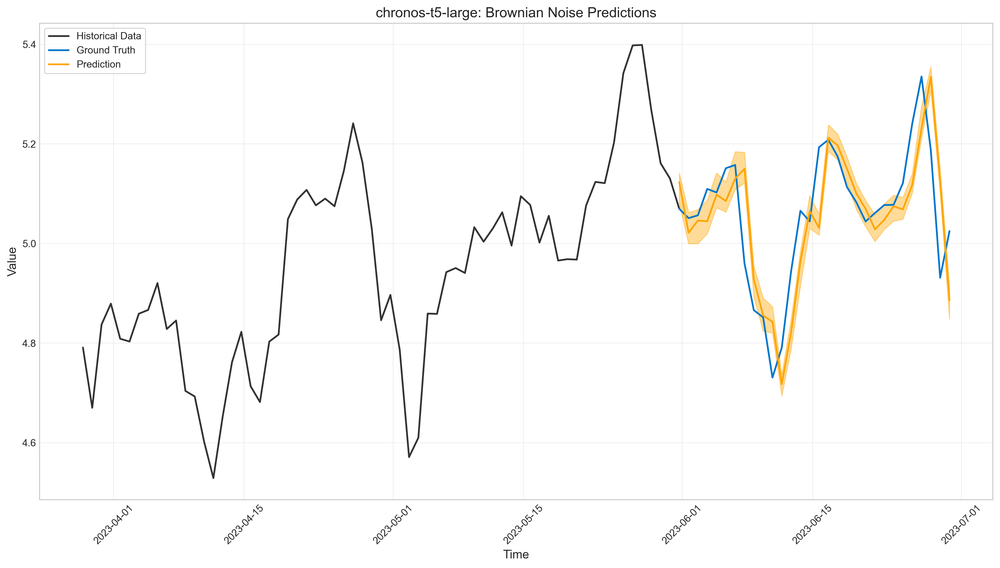

In [27]:
from data.synthetic.noise import NoiseGenerator

brownian_gen = NoiseGenerator(
    seq_length=2000,
    num_samples=1,
    noise_type="brownian",
    seed=42,
)
brownian_data = brownian_gen.generate()

brownian_df = convert_synthetic_to_dataframe(brownian_data)

# Select test start date
test_date_str = "2023-06-01"
test_date = pd.Timestamp(test_date_str)
date_indices_browniandf = brownian_df[brownian_df['Date'] <= test_date].index
test_start = date_indices_browniandf[-1]

# Run Chronos comparison
brownian_df_chronos_avg, brownian_df_chronos_std, brownian_df_chronos_preds = run_multiple_trials_comparison(
    brownian_df, 
    n_trials=5, 
    test_start=test_start,
    CONTEXT_WINDOW=120,
    FORECAST_STEPS=30
)

print("\nChronos T5 Context Scaling Metrics (Average ± Std):")
for metric in brownian_df_chronos_avg:
    print(f"{metric}: {brownian_df_chronos_avg[metric]:.4f} ± {brownian_df_chronos_std[metric]:.4f}")

plot_forecasts(brownian_df, test_start, brownian_df_chronos_preds, "chronos-t5-large: Brownian Noise Predictions", historical_window=64, FORECAST_STEPS=30)

## 10. Heavy-tailed Noise


Trial 1/5
Context scaling metrics: {'MAE': 1.1867837298059825, 'MSE': 2.4037074225957746, 'RMSE': 1.5503894422356514, 'Z-NormalizedMAE': 0.8532196163559869, 'Z-NormalizedMSE': 1.2423961605390976, 'Z-NormalizedRMSE': 1.1146282611431928, 'MAPE': 107.26270499158939, 'SMAPE': 174.72508727717135, 'MASE': 0.6216406128119443, 'DirectionalAccuracy': 46.666666666666664}

Trial 2/5
Context scaling metrics: {'MAE': 1.1797383870248874, 'MSE': 2.3690981717153354, 'RMSE': 1.539187503754931, 'Z-NormalizedMAE': 0.848154477262982, 'Z-NormalizedMSE': 1.224507793590279, 'Z-NormalizedRMSE': 1.1065748025281794, 'MAPE': 125.26318449978866, 'SMAPE': 175.9713358875016, 'MASE': 0.6179502427016075, 'DirectionalAccuracy': 56.666666666666664}

Trial 3/5
Context scaling metrics: {'MAE': 1.1840090373160819, 'MSE': 2.3277452585551544, 'RMSE': 1.5256950083667293, 'Z-NormalizedMAE': 0.8512247945512375, 'Z-NormalizedMSE': 1.203133852629597, 'Z-NormalizedRMSE': 1.0968745838196803, 'MAPE': 116.31620655898647, 'SMAPE': 1

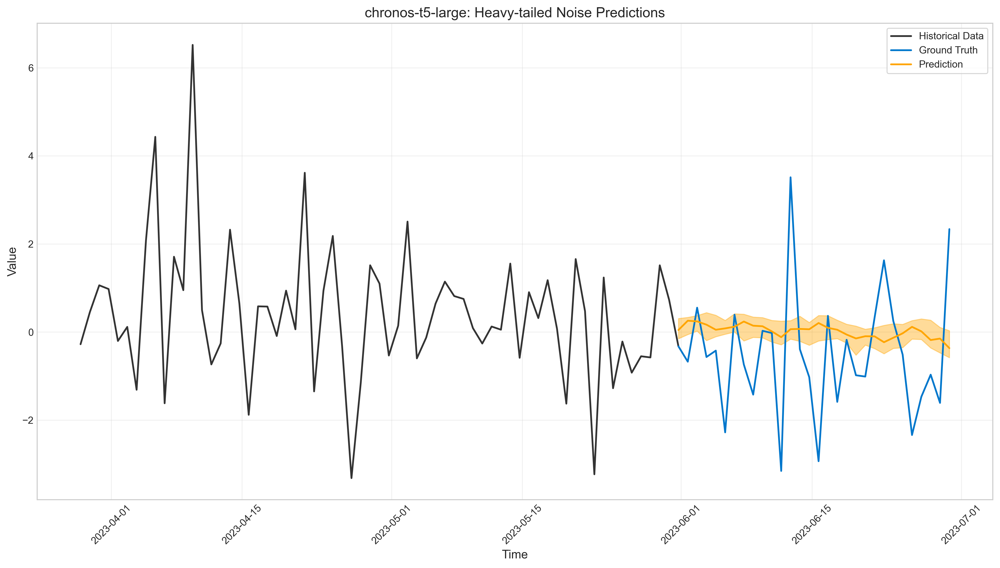

In [30]:
from data.synthetic.noise import NoiseGenerator

heavy_tailed_gen = NoiseGenerator(
    seq_length=2000,
    num_samples=1,
    noise_type="heavy_tailed",
    seed=42,
)
heavy_tailed_data = heavy_tailed_gen.generate()

heavy_tailed_df = convert_synthetic_to_dataframe(heavy_tailed_data)

# Select test start date
test_date_str = "2023-06-01"
test_date = pd.Timestamp(test_date_str)
date_indices_heavy_taileddf = heavy_tailed_df[heavy_tailed_df['Date'] <= test_date].index
test_start = date_indices_heavy_taileddf[-1]

# Run Chronos comparison
heavy_tailed_df_chronos_avg, heavy_tailed_df_chronos_std, heavy_tailed_df_chronos_preds = run_multiple_trials_comparison(
    heavy_tailed_df, 
    n_trials=5, 
    test_start=test_start,
    CONTEXT_WINDOW=120,
    FORECAST_STEPS=30
)

print("\nChronos T5 Context Scaling Metrics (Average ± Std):")
for metric in heavy_tailed_df_chronos_avg:
    print(f"{metric}: {heavy_tailed_df_chronos_avg[metric]:.4f} ± {heavy_tailed_df_chronos_std[metric]:.4f}")

plot_forecasts(heavy_tailed_df, test_start, heavy_tailed_df_chronos_preds, "chronos-t5-large: Heavy-tailed Noise Predictions", historical_window=64, FORECAST_STEPS=30)

## 11. Mixed Noise (Gaussina + Pink + Brownian) on Sine-based Signal


Trial 1/5
Context scaling metrics: {'MAE': 0.16172748840355047, 'MSE': 0.03901563130677707, 'RMSE': 0.19752374871588751, 'Z-NormalizedMAE': 0.23550043871890788, 'Z-NormalizedMSE': 0.08272835627316305, 'Z-NormalizedRMSE': 0.28762537487704914, 'MAPE': 75.92681474536191, 'SMAPE': 36.486507956383605, 'MASE': 0.5735833563092484, 'DirectionalAccuracy': 76.66666666666667}

Trial 2/5
Context scaling metrics: {'MAE': 0.15569951037710403, 'MSE': 0.037991438132398275, 'RMSE': 0.1949139249320024, 'Z-NormalizedMAE': 0.22672276286535206, 'Z-NormalizedMSE': 0.0805566672607176, 'Z-NormalizedRMSE': 0.28382506453926437, 'MAPE': 70.20715100508978, 'SMAPE': 36.62150108638234, 'MASE': 0.5522045053649977, 'DirectionalAccuracy': 70.0}

Trial 3/5
Context scaling metrics: {'MAE': 0.15251620592073098, 'MSE': 0.037835992447349746, 'RMSE': 0.194514761515289, 'Z-NormalizedMAE': 0.22208737525467517, 'Z-NormalizedMSE': 0.08022706177739976, 'Z-NormalizedRMSE': 0.2832438203693062, 'MAPE': 64.24546373444507, 'SMAPE': 

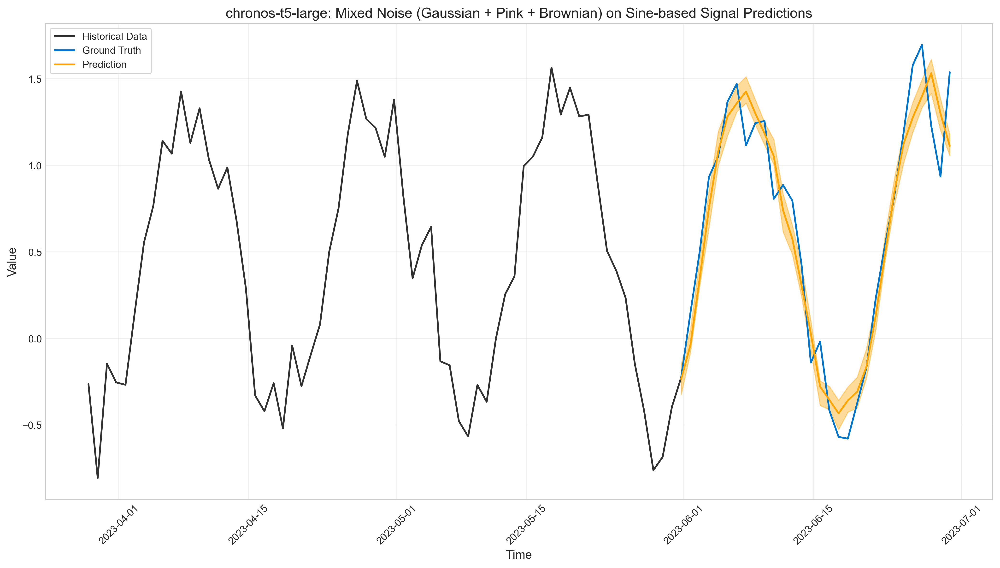

In [32]:
from data.synthetic.noise import MixedNoiseGenerator

mixed_gen = MixedNoiseGenerator(
    seq_length=2000,
    num_samples=1,
    base_signal="sine",
    seed=42,
)
mixed_data = mixed_gen.generate()

mixed_df = convert_synthetic_to_dataframe(mixed_data)

# Select test start date
test_date_str = "2023-06-01"
test_date = pd.Timestamp(test_date_str)
date_indices_mixeddf = mixed_df[mixed_df['Date'] <= test_date].index
test_start = date_indices_mixeddf[-1]

# Run Chronos comparison
mixed_df_chronos_avg, mixed_df_chronos_std, mixed_df_chronos_preds = run_multiple_trials_comparison(
    mixed_df, 
    n_trials=5, 
    test_start=test_start,
    CONTEXT_WINDOW=120,
    FORECAST_STEPS=30
)

print("\nChronos T5 Context Scaling Metrics (Average ± Std):")
for metric in mixed_df_chronos_avg:
    print(f"{metric}: {mixed_df_chronos_avg[metric]:.4f} ± {mixed_df_chronos_std[metric]:.4f}")

plot_forecasts(mixed_df, test_start, mixed_df_chronos_preds, "chronos-t5-large: Mixed Noise (Gaussian + Pink + Brownian) on Sine-based Signal Predictions", historical_window=64, FORECAST_STEPS=30)

## 12. Mixed Noise (Gaussina + Pink + Brownian + Heavy-tailed) on Sine-based Signal


Trial 1/5
Context scaling metrics: {'MAE': 0.20816405996192527, 'MSE': 0.07143176145740646, 'RMSE': 0.2672672098432699, 'Z-NormalizedMAE': 0.2958626874235305, 'Z-NormalizedMSE': 0.14429798146801265, 'Z-NormalizedRMSE': 0.3798657413718861, 'MAPE': 31.029187143851285, 'SMAPE': 36.67043478191448, 'MASE': 0.5782141424233638, 'DirectionalAccuracy': 76.66666666666667}

Trial 2/5
Context scaling metrics: {'MAE': 0.19811620032547944, 'MSE': 0.06544725355760427, 'RMSE': 0.25582660838467186, 'Z-NormalizedMAE': 0.2815817075298975, 'Z-NormalizedMSE': 0.13220878763599783, 'Z-NormalizedRMSE': 0.36360526348775235, 'MAPE': 29.173982004535503, 'SMAPE': 35.351869027336875, 'MASE': 0.5503043555757182, 'DirectionalAccuracy': 73.33333333333333}

Trial 3/5
Context scaling metrics: {'MAE': 0.20824051922343104, 'MSE': 0.06844148745528278, 'RMSE': 0.2616132402140281, 'Z-NormalizedMAE': 0.29597135864464164, 'Z-NormalizedMSE': 0.13825738420792671, 'Z-NormalizedRMSE': 0.3718297785384149, 'MAPE': 30.8048426487535

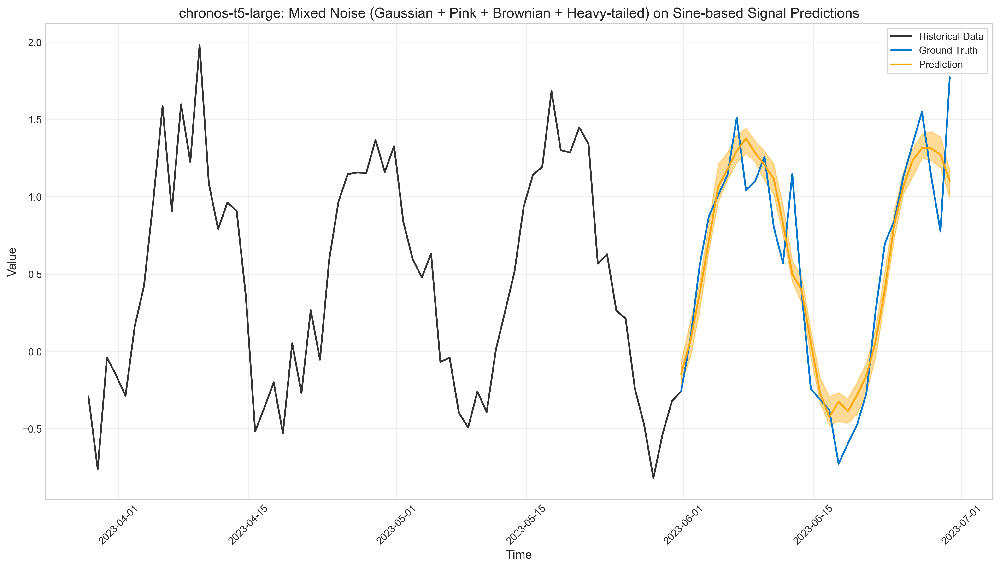

In [7]:
from data.synthetic.noise import MixedNoiseGenerator

mixed_gen = MixedNoiseGenerator(
    seq_length=2000,
    num_samples=1,
    base_signal="sine",
    seed=42,
)
mixed_data = mixed_gen.generate()

mixed_df = convert_synthetic_to_dataframe(mixed_data)

# Select test start date
test_date_str = "2023-06-01"
test_date = pd.Timestamp(test_date_str)
date_indices_mixeddf = mixed_df[mixed_df['Date'] <= test_date].index
test_start = date_indices_mixeddf[-1]

# Run Chronos comparison
mixed_df_chronos_avg, mixed_df_chronos_std, mixed_df_chronos_preds = run_multiple_trials_comparison(
    mixed_df, 
    n_trials=5, 
    test_start=test_start,
    CONTEXT_WINDOW=120,
    FORECAST_STEPS=30
)

print("\nChronos T5 Context Scaling Metrics (Average ± Std):")
for metric in mixed_df_chronos_avg:
    print(f"{metric}: {mixed_df_chronos_avg[metric]:.4f} ± {mixed_df_chronos_std[metric]:.4f}")

plot_forecasts(mixed_df, test_start, mixed_df_chronos_preds, "chronos-t5-large: Mixed Noise (Gaussian + Pink + Brownian + Heavy-tailed) on Sine-based Signal Predictions", historical_window=64, FORECAST_STEPS=30)

### Here we obvserve something intuiative and allows us to identify the gap fot better predictions, when we add patterns like heavy-tailed or non-stationary to a signal where our predictions are completely off, it deminishes the overall prediction. So if we are able to adress the signals that we are bad at predicting, we can improve performance on more complicated signals.

# Varying Volatility and Statistical Patterns

## 13. High Mean


Trial 1/5
Context scaling metrics: {'MAE': 0.08366053258332139, 'MSE': 0.011146607943459612, 'RMSE': 0.10557749733470485, 'Z-NormalizedMAE': 0.12310866916136358, 'Z-NormalizedMSE': 0.024136747606191156, 'Z-NormalizedRMSE': 0.15536005794988347, 'MAPE': 0.8199056624830029, 'SMAPE': 0.8212259544915711, 'MASE': 0.3957171514563578, 'DirectionalAccuracy': 83.33333333333334}

Trial 2/5
Context scaling metrics: {'MAE': 0.08722323643322127, 'MSE': 0.011723460028907158, 'RMSE': 0.10827492797922868, 'Z-NormalizedMAE': 0.12835128137089524, 'Z-NormalizedMSE': 0.025385857044970876, 'Z-NormalizedRMSE': 0.15932939793073617, 'MAPE': 0.8524816372762442, 'SMAPE': 0.8536434115585311, 'MASE': 0.4125688612821454, 'DirectionalAccuracy': 86.66666666666667}

Trial 3/5
Context scaling metrics: {'MAE': 0.0750442250949027, 'MSE': 0.009216365763478786, 'RMSE': 0.09600190499921753, 'Z-NormalizedMAE': 0.11042954657834783, 'Z-NormalizedMSE': 0.019957021491004836, 'Z-NormalizedRMSE': 0.14126932254033372, 'MAPE': 0.73

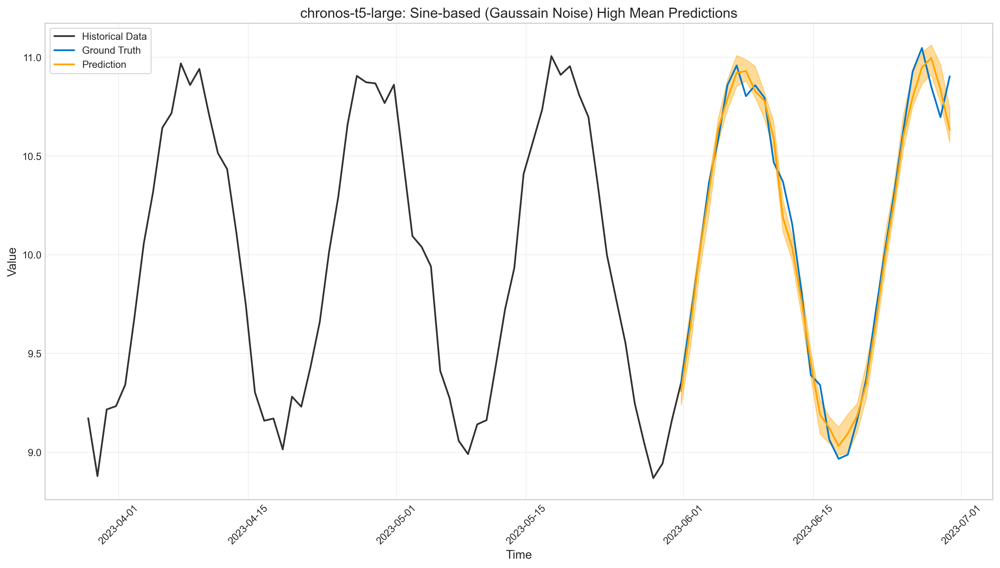

In [7]:
from data.synthetic.statistical_patterns import VaryingMeanGenerator 

highmean_gen = VaryingMeanGenerator(
    seq_length=2000,
    num_samples=1,
    mean_level="high",
    seasonal=True,
    seed=42,
)
highmean_data = highmean_gen.generate()

highmean_df = convert_synthetic_to_dataframe(highmean_data)

# Select test start date
test_date_str = "2023-06-01"
test_date = pd.Timestamp(test_date_str)
date_indices_highmeandf = highmean_df[highmean_df['Date'] <= test_date].index
test_start = date_indices_highmeandf[-1]

# Run Chronos comparison
highmean_df_chronos_avg, highmean_df_chronos_std, highmean_df_chronos_preds = run_multiple_trials_comparison(
    highmean_df, 
    n_trials=5, 
    test_start=test_start,
    CONTEXT_WINDOW=120,
    FORECAST_STEPS=30
)

print("\nChronos T5 Context Scaling Metrics (Average ± Std):")
for metric in highmean_df_chronos_avg:
    print(f"{metric}: {highmean_df_chronos_avg[metric]:.4f} ± {highmean_df_chronos_std[metric]:.4f}")

plot_forecasts(highmean_df, test_start, highmean_df_chronos_preds, "chronos-t5-large: Sine-based (Gaussain Noise) High Mean Predictions", historical_window=64, FORECAST_STEPS=30)

## 14. Low Mean


Trial 1/5
Context scaling metrics: {'MAE': 0.07914829897110612, 'MSE': 0.01051798346519244, 'RMSE': 0.10255722044396699, 'Z-NormalizedMAE': 0.11646879898851056, 'Z-NormalizedMSE': 0.022775530772516546, 'Z-NormalizedRMSE': 0.15091564124542078, 'MAPE': 0.8203346188569206, 'SMAPE': 0.81903809902485, 'MASE': 0.37437413370837574, 'DirectionalAccuracy': 86.66666666666667}

Trial 2/5
Context scaling metrics: {'MAE': 0.0785316453688754, 'MSE': 0.010457737493669518, 'RMSE': 0.10226307981705576, 'Z-NormalizedMAE': 0.11556137703027025, 'Z-NormalizedMSE': 0.022645074779418507, 'Z-NormalizedRMSE': 0.15048280559392327, 'MAPE': 0.8086106521300241, 'SMAPE': 0.8069329691852286, 'MASE': 0.37145734129294367, 'DirectionalAccuracy': 86.66666666666667}

Trial 3/5
Context scaling metrics: {'MAE': 0.08771790204704276, 'MSE': 0.011448434215207063, 'RMSE': 0.1069973561131632, 'Z-NormalizedMAE': 0.1290791948029165, 'Z-NormalizedMSE': 0.024790319040571825, 'Z-NormalizedRMSE': 0.157449417403088, 'MAPE': 0.9067971

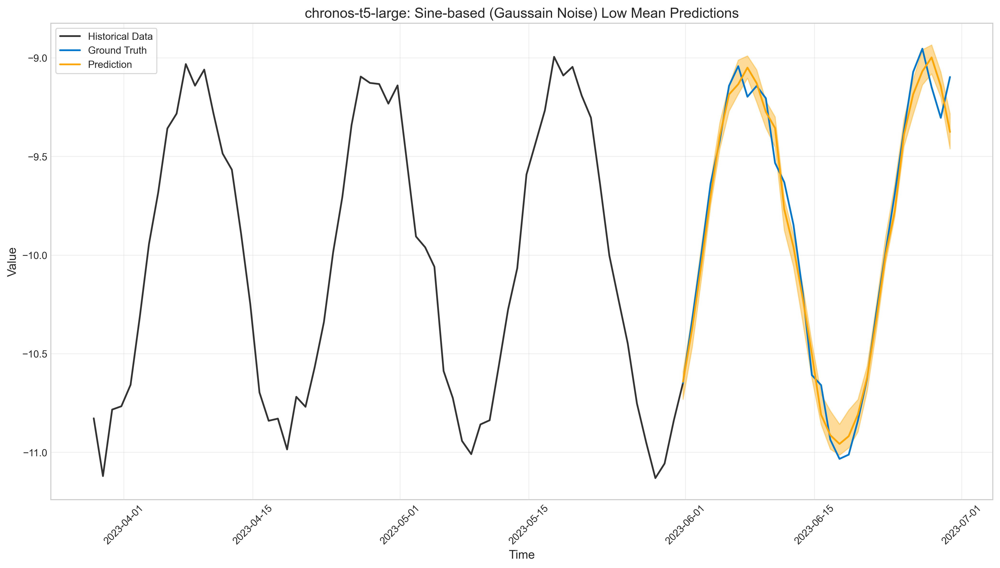

In [8]:
from data.synthetic.statistical_patterns import VaryingMeanGenerator 

lowmean_gen = VaryingMeanGenerator(
    seq_length=2000,
    num_samples=1,
    mean_level="low",
    seasonal=True,
    seed=42,
)
lowmean_data = lowmean_gen.generate()

lowmean_df = convert_synthetic_to_dataframe(lowmean_data)

# Select test start date
test_date_str = "2023-06-01"
test_date = pd.Timestamp(test_date_str)
date_indices_lowmeandf = lowmean_df[lowmean_df['Date'] <= test_date].index
test_start = date_indices_lowmeandf[-1]

# Run Chronos comparison
lowmean_df_chronos_avg, lowmean_df_chronos_std, lowmean_df_chronos_preds = run_multiple_trials_comparison(
    lowmean_df, 
    n_trials=5, 
    test_start=test_start,
    CONTEXT_WINDOW=120,
    FORECAST_STEPS=30
)

print("\nChronos T5 Context Scaling Metrics (Average ± Std):")
for metric in lowmean_df_chronos_avg:
    print(f"{metric}: {lowmean_df_chronos_avg[metric]:.4f} ± {lowmean_df_chronos_std[metric]:.4f}")

plot_forecasts(lowmean_df, test_start, lowmean_df_chronos_preds, "chronos-t5-large: Sine-based (Gaussain Noise) Low Mean Predictions", historical_window=64, FORECAST_STEPS=30)

## 15. Varying Mean


Trial 1/5
Context scaling metrics: {'MAE': 0.12437971403796502, 'MSE': 0.025465846227493236, 'RMSE': 0.1595802187850776, 'Z-NormalizedMAE': 0.09705851778094395, 'Z-NormalizedMSE': 0.015506947402738848, 'Z-NormalizedRMSE': 0.12452689429492268, 'MAPE': 3.5705654802934257, 'SMAPE': 3.6756935483331192, 'MASE': 0.45224208440660796, 'DirectionalAccuracy': 80.0}

Trial 2/5
Context scaling metrics: {'MAE': 0.1229402939343862, 'MSE': 0.024958649704788508, 'RMSE': 0.15798306777876073, 'Z-NormalizedMAE': 0.0959352800986736, 'Z-NormalizedMSE': 0.015198099633449208, 'Z-NormalizedRMSE': 0.12328057281441065, 'MAPE': 3.6939056773630545, 'SMAPE': 3.8137656196875565, 'MASE': 0.44700838248813785, 'DirectionalAccuracy': 80.0}

Trial 3/5
Context scaling metrics: {'MAE': 0.13728334399116415, 'MSE': 0.029142627622188163, 'RMSE': 0.17071211914269052, 'Z-NormalizedMAE': 0.10712774174514297, 'Z-NormalizedMSE': 0.017745854179665357, 'Z-NormalizedRMSE': 0.13321356604965334, 'MAPE': 3.892412482302902, 'SMAPE': 3.

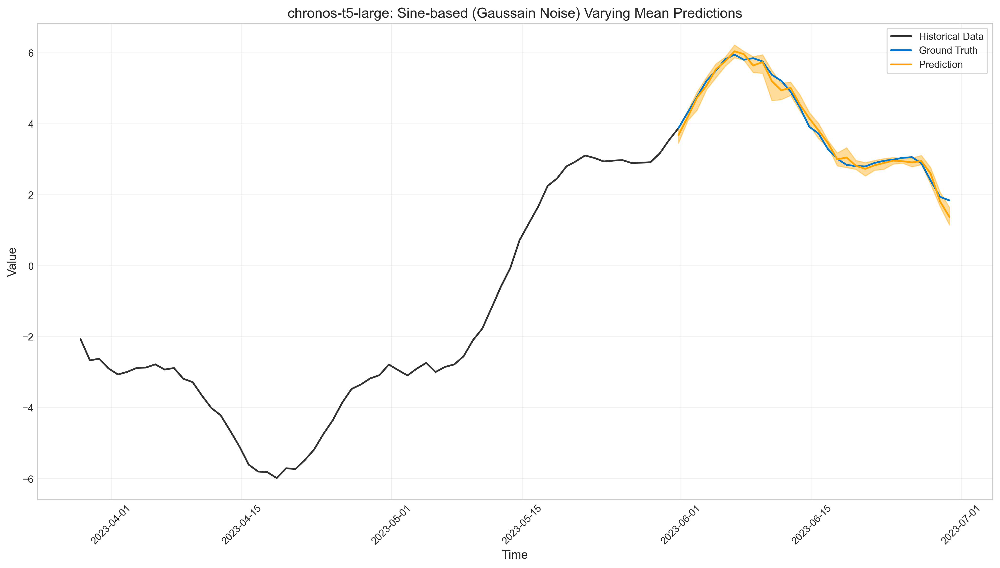

In [9]:
from data.synthetic.statistical_patterns import VaryingMeanGenerator 

varyingmean_gen = VaryingMeanGenerator(
    seq_length=2000,
    num_samples=1,
    mean_level="varying",
    seasonal=True,
    seed=42,
)
varyingmean_data = varyingmean_gen.generate()

varyingmean_df = convert_synthetic_to_dataframe(varyingmean_data)

# Select test start date
test_date_str = "2023-06-01"
test_date = pd.Timestamp(test_date_str)
date_indices_varyingmeandf = varyingmean_df[varyingmean_df['Date'] <= test_date].index
test_start = date_indices_varyingmeandf[-1]

# Run Chronos comparison
varyingmean_df_chronos_avg, varyingmean_df_chronos_std, varyingmean_df_chronos_preds = run_multiple_trials_comparison(
    varyingmean_df, 
    n_trials=5, 
    test_start=test_start,
    CONTEXT_WINDOW=120,
    FORECAST_STEPS=30
)

print("\nChronos T5 Context Scaling Metrics (Average ± Std):")
for metric in varyingmean_df_chronos_avg:
    print(f"{metric}: {varyingmean_df_chronos_avg[metric]:.4f} ± {varyingmean_df_chronos_std[metric]:.4f}")

plot_forecasts(varyingmean_df, test_start, varyingmean_df_chronos_preds, "chronos-t5-large: Sine-based (Gaussain Noise) Varying Mean Predictions", historical_window=64, FORECAST_STEPS=30)

## 16. High Volatility (std = 2.0)


Trial 1/5
Context scaling metrics: {'MAE': 1.5877517097085676, 'MSE': 3.570154793843249, 'RMSE': 1.8894853251198458, 'Z-NormalizedMAE': 0.845105501398693, 'Z-NormalizedMSE': 1.0114483869360273, 'Z-NormalizedRMSE': 1.0057079033874734, 'MAPE': 95.39895586470183, 'SMAPE': 164.215102881998, 'MASE': 0.7081395813361334, 'DirectionalAccuracy': 43.333333333333336}

Trial 2/5
Context scaling metrics: {'MAE': 1.6133795238507176, 'MSE': 3.7039903275161805, 'RMSE': 1.9245753629089666, 'Z-NormalizedMAE': 0.8587463034132155, 'Z-NormalizedMSE': 1.0493648758461585, 'Z-NormalizedRMSE': 1.02438512086332, 'MAPE': 96.1270024816196, 'SMAPE': 161.24297484291904, 'MASE': 0.7195696238712559, 'DirectionalAccuracy': 36.666666666666664}

Trial 3/5
Context scaling metrics: {'MAE': 1.6063617983599954, 'MSE': 3.6816051204909552, 'RMSE': 1.9187509271635428, 'Z-NormalizedMAE': 0.855011010052641, 'Z-NormalizedMSE': 1.0430229991365159, 'Z-NormalizedRMSE': 1.021284974498556, 'MAPE': 104.73916637228781, 'SMAPE': 160.694

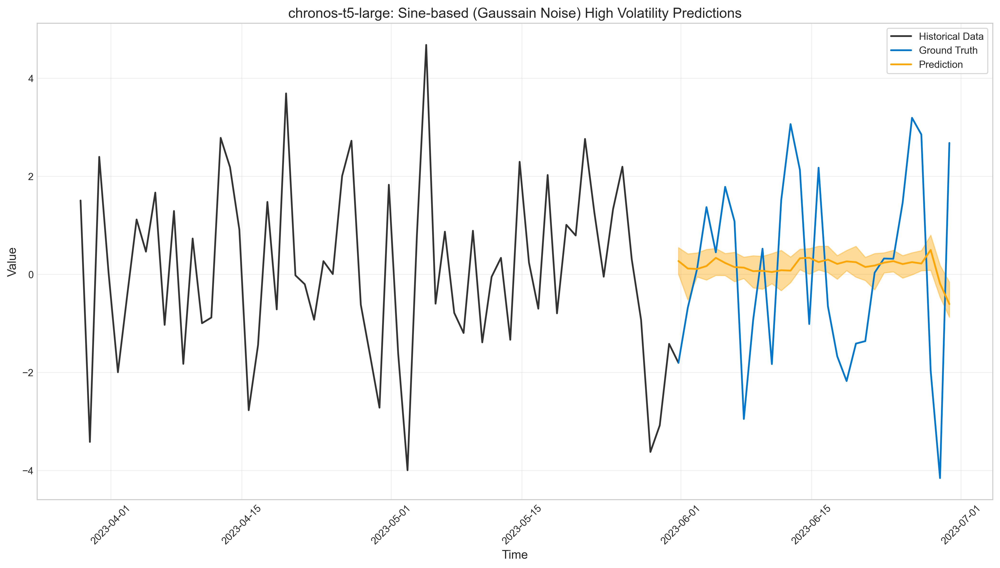

In [10]:
from data.synthetic.statistical_patterns import VaryingVolatilityGenerator 

highvol_gen = VaryingVolatilityGenerator(
    seq_length=2000,
    num_samples=1,
    volatility_type="high",
    seed=42,
)
highvol_data = highvol_gen.generate()

highvol_df = convert_synthetic_to_dataframe(highvol_data)

# Select test start date
test_date_str = "2023-06-01"
test_date = pd.Timestamp(test_date_str)
date_indices_highvoldf = highvol_df[highvol_df['Date'] <= test_date].index
test_start = date_indices_highvoldf[-1]

# Run Chronos comparison
highvol_df_chronos_avg, highvol_df_chronos_std, highvol_df_chronos_preds = run_multiple_trials_comparison(
    highvol_df, 
    n_trials=5, 
    test_start=test_start,
    CONTEXT_WINDOW=120,
    FORECAST_STEPS=30
)

print("\nChronos T5 Context Scaling Metrics (Average ± Std):")
for metric in highvol_df_chronos_avg:
    print(f"{metric}: {highvol_df_chronos_avg[metric]:.4f} ± {highvol_df_chronos_std[metric]:.4f}")

plot_forecasts(highvol_df, test_start, highvol_df_chronos_preds, "chronos-t5-large: Sine-based (Gaussain Noise) High Volatility Predictions", historical_window=64, FORECAST_STEPS=30)

## 17. Low Volatility (std = 0.5)


Trial 1/5
Context scaling metrics: {'MAE': 0.3761183058286449, 'MSE': 0.20818564997316458, 'RMSE': 0.45627365689152444, 'Z-NormalizedMAE': 0.49522754882835374, 'Z-NormalizedMSE': 0.36092040834674705, 'Z-NormalizedRMSE': 0.6007665173316061, 'MAPE': 460.8421296899798, 'SMAPE': 76.15622374151573, 'MASE': 0.6523009990970672, 'DirectionalAccuracy': 60.0}

Trial 2/5
Context scaling metrics: {'MAE': 0.3890571680918301, 'MSE': 0.22331603610822506, 'RMSE': 0.47256326148805206, 'Z-NormalizedMAE': 0.512263893361247, 'Z-NormalizedMSE': 0.3871511554852453, 'Z-NormalizedRMSE': 0.622214718152219, 'MAPE': 471.15755308856234, 'SMAPE': 80.44069102238667, 'MASE': 0.6747408342517545, 'DirectionalAccuracy': 63.33333333333333}

Trial 3/5
Context scaling metrics: {'MAE': 0.3845631526629919, 'MSE': 0.21389229973336735, 'RMSE': 0.46248491838476996, 'Z-NormalizedMAE': 0.5063467119565368, 'Z-NormalizedMSE': 0.37081372405803525, 'Z-NormalizedRMSE': 0.6089447627314281, 'MAPE': 463.8838849181928, 'SMAPE': 83.52038

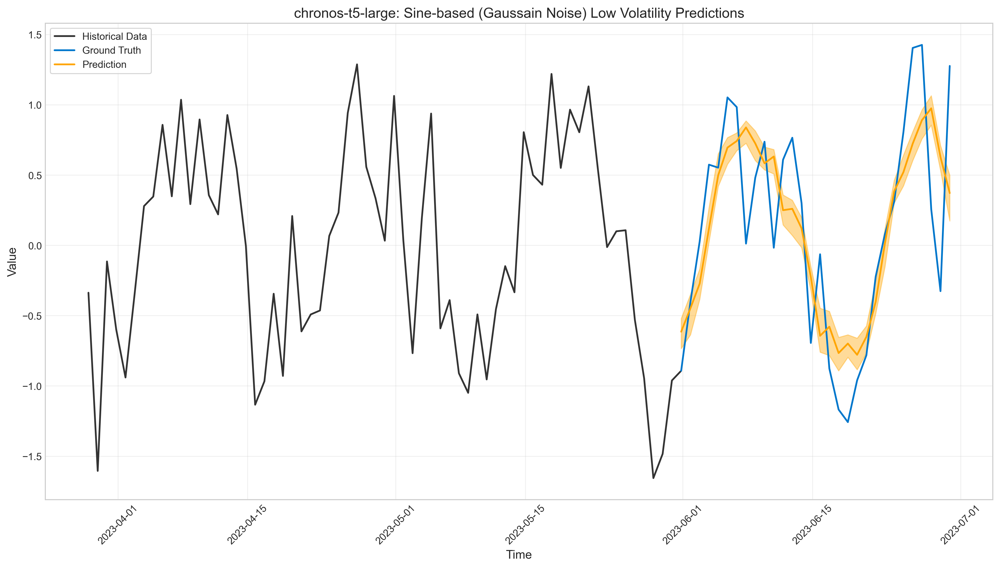

In [6]:
from data.synthetic.statistical_patterns import VaryingVolatilityGenerator 

lowvol_gen = VaryingVolatilityGenerator(
    seq_length=2000,
    num_samples=1,
    volatility_type="low",
    seed=42,
)
lowvol_data = lowvol_gen.generate()

lowvol_df = convert_synthetic_to_dataframe(lowvol_data)

# Select test start date
test_date_str = "2023-06-01"
test_date = pd.Timestamp(test_date_str)
date_indices_lowvoldf = lowvol_df[lowvol_df['Date'] <= test_date].index
test_start = date_indices_lowvoldf[-1]

# Run Chronos comparison
lowvol_df_chronos_avg, lowvol_df_chronos_std, lowvol_df_chronos_preds = run_multiple_trials_comparison(
    lowvol_df, 
    n_trials=5, 
    test_start=test_start,
    CONTEXT_WINDOW=120,
    FORECAST_STEPS=30
)

print("\nChronos T5 Context Scaling Metrics (Average ± Std):")
for metric in lowvol_df_chronos_avg:
    print(f"{metric}: {lowvol_df_chronos_avg[metric]:.4f} ± {lowvol_df_chronos_std[metric]:.4f}")

plot_forecasts(lowvol_df, test_start, lowvol_df_chronos_preds, "chronos-t5-large: Sine-based (Gaussain Noise) Low Volatility Predictions", historical_window=64, FORECAST_STEPS=30)

## 18. Varying Volarility(std = `1 + np.sin(2 * np.pi * 0.01 * t)`)


Trial 1/5
Context scaling metrics: {'MAE': 1.3201428373153357, 'MSE': 2.5935282805133855, 'RMSE': 1.610443504291096, 'Z-NormalizedMAE': 0.8290849490254081, 'Z-NormalizedMSE': 1.0229330321846895, 'Z-NormalizedRMSE': 1.0114015187771321, 'MAPE': 213.17232009378188, 'SMAPE': 127.62861201875464, 'MASE': 1.059369697078791, 'DirectionalAccuracy': 43.333333333333336}

Trial 2/5
Context scaling metrics: {'MAE': 1.3084025013154479, 'MSE': 2.565126289576134, 'RMSE': 1.6016011643277905, 'Z-NormalizedMAE': 0.8217117045560423, 'Z-NormalizedMSE': 1.0117307889210172, 'Z-NormalizedRMSE': 1.005848293193868, 'MAPE': 206.87906994917063, 'SMAPE': 124.94023623344515, 'MASE': 1.049948477010592, 'DirectionalAccuracy': 40.0}

Trial 3/5
Context scaling metrics: {'MAE': 1.3175521494814995, 'MSE': 2.586717576278527, 'RMSE': 1.608327571198892, 'Z-NormalizedMAE': 0.8274579278956151, 'Z-NormalizedMSE': 1.0202467710065781, 'Z-NormalizedRMSE': 1.010072656300812, 'MAPE': 207.34578850523388, 'SMAPE': 126.69496426853321

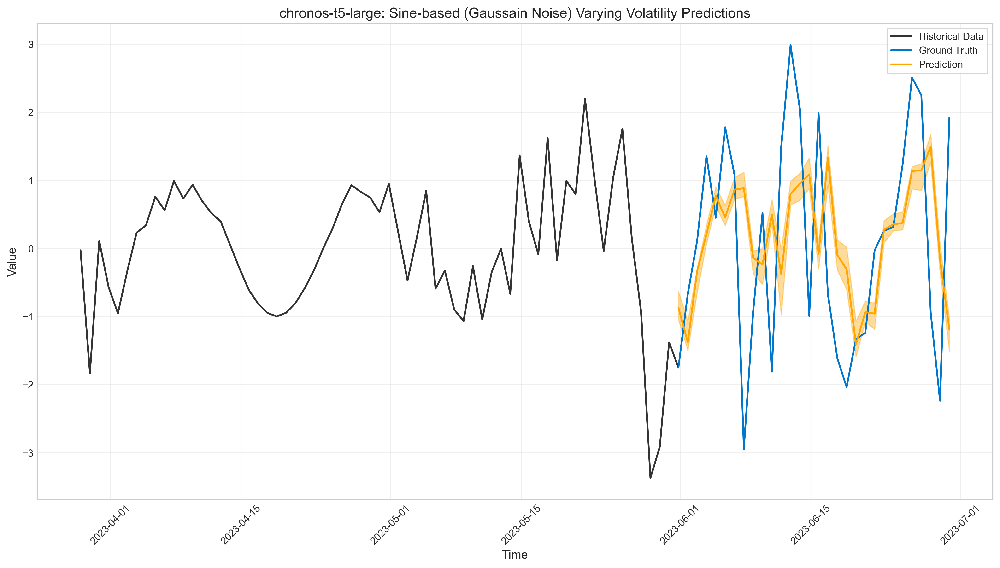

In [7]:
from data.synthetic.statistical_patterns import VaryingVolatilityGenerator 

varyingvol_gen = VaryingVolatilityGenerator(
    seq_length=2000,
    num_samples=1,
    volatility_type="varying",
    seed=42,
)
varyingvol_data = varyingvol_gen.generate()

varyingvol_df = convert_synthetic_to_dataframe(varyingvol_data)

# Select test start date
test_date_str = "2023-06-01"
test_date = pd.Timestamp(test_date_str)
date_indices_varyingvoldf = varyingvol_df[varyingvol_df['Date'] <= test_date].index
test_start = date_indices_varyingvoldf[-1]

# Run Chronos comparison
varyingvol_df_chronos_avg, varyingvol_df_chronos_std, varyingvol_df_chronos_preds = run_multiple_trials_comparison(
    varyingvol_df, 
    n_trials=5, 
    test_start=test_start,
    CONTEXT_WINDOW=120,
    FORECAST_STEPS=30
)

print("\nChronos T5 Context Scaling Metrics (Average ± Std):")
for metric in varyingvol_df_chronos_avg:
    print(f"{metric}: {varyingvol_df_chronos_avg[metric]:.4f} ± {varyingvol_df_chronos_std[metric]:.4f}")

plot_forecasts(varyingvol_df, test_start, varyingvol_df_chronos_preds, "chronos-t5-large: Sine-based (Gaussain Noise) Varying Volatility Predictions", historical_window=64, FORECAST_STEPS=30)

# Synthetic Data for Financial Time Series Modeling

# 1. Volatility Clustering

### 1.1. Description

simulates time series data exhibiting volatility clustering—a phenomenon where periods of high volatility tend to be followed by high volatility, and periods of low volatility by low volatility. This behavior is modeled using a mechanism similar to the Generalized Autoregressive Conditional Heteroskedasticity (GARCH) process.

### 1.2. Formulation

- **Price Evolution:**

  $$
  P_t = P_{t-1} \times (1 + r_t)
  $$

  where $P_0 = 100$ and $r_t$ is the return at time $t$.

- **Return Calculation:**

  $$
  r_t = \mu + \min\Bigl(0.05, \sqrt{\sigma_{t-1}}\Bigr) \cdot z_t,
  $$

  where:
  - $\mu$ is the mean daily return.
  - $z_t \sim \mathcal{N}(0,1)$ is a standard normal innovation.
  - $\min\bigl(0.05, \sqrt{\sigma_{t-1}}\bigr)$ provides an upper cap on the volatility.

- **Volatility Update (GARCH-like Process):**

  $$
  \sigma_t = \omega + \alpha \,(r_{t-1} - \mu)^2 + \beta \,\sigma_{t-1},
  $$

  where:
  - $\omega$ is the base level of volatility.
  - $\alpha$ controls the impact of the lagged squared return deviation.
  - $\beta$ governs the persistence of past volatility.

  A hard cap is often applied to $\sigma_t$ (e.g., $\sigma_t \le 0.0025$) to ensure numerical stability.

### 1.3. Market Behaviour Captured

captures the **volatility clustering** phenomenon -> reflects the fact that market volatility tends to persist over time, important for risk management and forecasting.


Trial 1/5
Context scaling metrics: {'MAE': 3.9003592653933947, 'MSE': 24.407928045438272, 'RMSE': 4.940438041858057, 'Z-NormalizedMAE': 0.5178250507558101, 'Z-NormalizedMSE': 0.43021723324173966, 'Z-NormalizedRMSE': 0.6559094703095387, 'MAPE': 2.337872999551389, 'SMAPE': 2.3400539483639617, 'MASE': 0.7949076698953541, 'DirectionalAccuracy': 72.41379310344827}

Trial 2/5
Context scaling metrics: {'MAE': 3.928642246132761, 'MSE': 24.113335251995615, 'RMSE': 4.910533092444813, 'Z-NormalizedMAE': 0.5215799961186216, 'Z-NormalizedMSE': 0.4250247033272006, 'Z-NormalizedRMSE': 0.651939186832024, 'MAPE': 2.352106022479154, 'SMAPE': 2.356527896379223, 'MASE': 0.8006718461641157, 'DirectionalAccuracy': 72.41379310344827}

Trial 3/5
Context scaling metrics: {'MAE': 3.8393457780338025, 'MSE': 24.33151421079985, 'RMSE': 4.932698471506225, 'Z-NormalizedMAE': 0.5097246912660841, 'Z-NormalizedMSE': 0.4288703533075505, 'Z-NormalizedRMSE': 0.6548819384496343, 'MAPE': 2.30047213993505, 'SMAPE': 2.302410

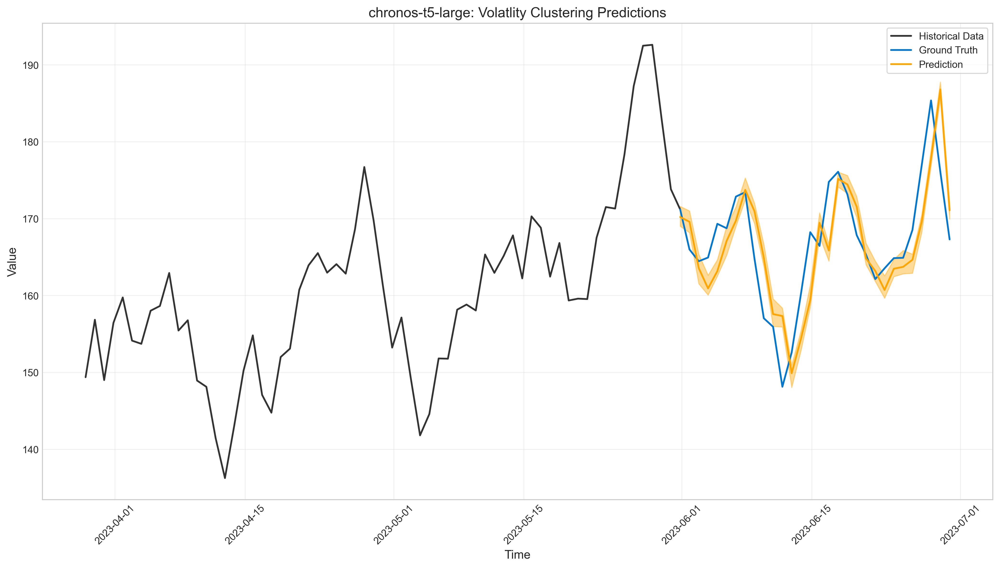

In [8]:
from data.synthetic.financial_patterns import VolatilityClusteringGenerator

volclustering_gen = VolatilityClusteringGenerator(
    seq_length=2000,
    num_samples=1,
    alpha=0.05,
    beta=0.85,
    omega=0.01,
    mean_return=0.0001,
    seed=42,
)
volclustering_data = volclustering_gen.generate()

volclustering_df = convert_synthetic_to_dataframe(volclustering_data)

# Select test start date
test_date_str = "2023-06-01"
test_date = pd.Timestamp(test_date_str)
date_indices_volclusteringdf = volclustering_df[volclustering_df['Date'] <= test_date].index
test_start = date_indices_volclusteringdf[-1]

# Run Chronos comparison
volclustering_df_chronos_avg, volclustering_df_chronos_std, volclustering_df_chronos_preds = run_multiple_trials_comparison(
    volclustering_df, 
    n_trials=5, 
    test_start=test_start,
    CONTEXT_WINDOW=120,
    FORECAST_STEPS=30
)

print("\nChronos T5 Context Scaling Metrics (Average ± Std):")
for metric in volclustering_df_chronos_avg:
    print(f"{metric}: {volclustering_df_chronos_avg[metric]:.4f} ± {volclustering_df_chronos_std[metric]:.4f}")

plot_forecasts(volclustering_df, test_start, volclustering_df_chronos_preds, "chronos-t5-large: Volatlity Clustering Predictions", historical_window=64, FORECAST_STEPS=30)

## 2. Jump Diffusion

### 2.1. Description

models asset prices using a jump diffusion process. It incorporates both continuous diffusion and discontinuous jump components, simulating sudden and significant price changes seen in financial markets.

### 2.2. Formulation

- **Price Evolution:**

  $$
  P_t = P_{t-1} \times (1 + r_t)
  $$

  where $r_t$ is a composite return (diffusion + jump).

- **Diffusion Component:**

  $$
  \text{diffusion} = \delta + \epsilon_t,
  $$

  where:
  - $\delta$ is a constant drift term.
  - $\epsilon_t \sim \mathcal{N}(0, \sigma_{\text{diff}}^2)$ is normally distributed noise.

- **Jump Component:**
  
  With probability $p$ (the jump frequency), a jump is introduced:

  $$
  J \sim \mathcal{N}\Bigl(\mu_J, \sigma_J^2\Bigr),
  $$

  and its sign or magnitude may be controlled per sample for diversity.

- **Return Aggregation and Capping:**

  $$
  r_t = \text{diffusion} + \text{jump},
  $$

  with the final return $r_t$ being bounded (e.g., $\lvert r_t \rvert \le 0.05$) to maintain stability.

### 2.3. Market Behaviour Captured

**jump diffusion phenomenon**, effectively modeling sudden shocks such as macroeconomic news or earnings surprises. It provides a testing framework for model robustness in the presence of discontinuities.


Trial 1/5
Context scaling metrics: {'MAE': 2.158898422848667, 'MSE': 7.472110673957638, 'RMSE': 2.733516174080124, 'Z-NormalizedMAE': 0.39144266059307503, 'Z-NormalizedMSE': 0.24564910545840718, 'Z-NormalizedRMSE': 0.49563000863386714, 'MAPE': 0.8204077987238841, 'SMAPE': 0.8204791331512853, 'MASE': 0.9526780494086576, 'DirectionalAccuracy': 50.0}

Trial 2/5
Context scaling metrics: {'MAE': 2.1075244304635588, 'MSE': 7.076551037405045, 'RMSE': 2.6601787604228866, 'Z-NormalizedMAE': 0.3821277377362692, 'Z-NormalizedMSE': 0.2326448988674559, 'Z-NormalizedRMSE': 0.4823327677728893, 'MAPE': 0.8007743361164839, 'SMAPE': 0.8010190059879659, 'MASE': 0.9300077494363227, 'DirectionalAccuracy': 46.42857142857143}

Trial 3/5
Context scaling metrics: {'MAE': 2.0778117603242947, 'MSE': 7.140929156731375, 'RMSE': 2.6722517016051044, 'Z-NormalizedMAE': 0.37674035751979235, 'Z-NormalizedMSE': 0.2347613594116935, 'Z-NormalizedRMSE': 0.4845217842488545, 'MAPE': 0.789189586341273, 'SMAPE': 0.78947981063

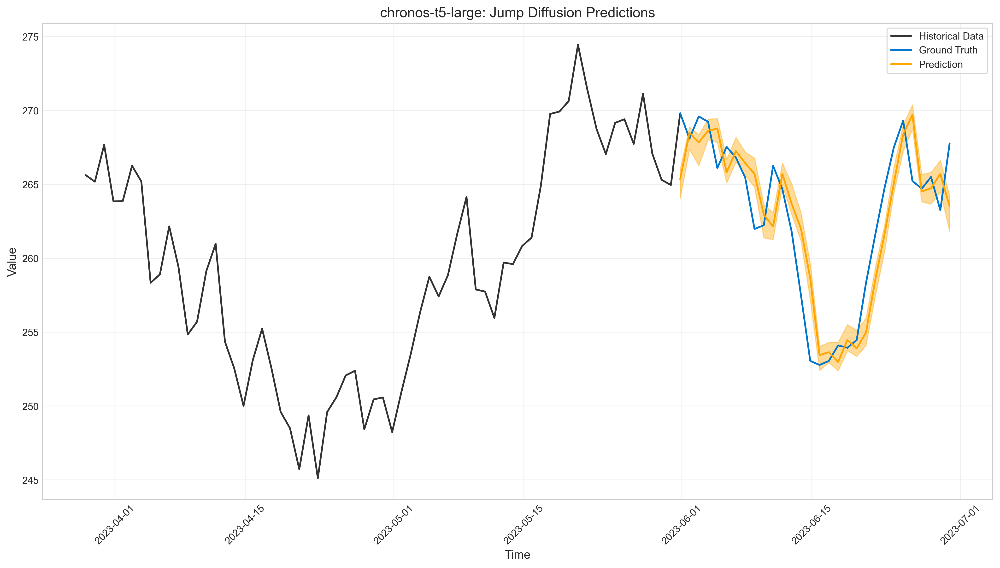

In [9]:
from data.synthetic.financial_patterns import JumpDiffusionGenerator

jumpdiffusion_gen = JumpDiffusionGenerator(
    seq_length=2000,
    num_samples=1,
    jump_frequency=0.015,
    jump_size_mean=0.0,
    jump_size_std=0.02,
    drift=0.0002,
    diffusion_std=0.01,
    seed=42,
)
jumpdiffusion_data = jumpdiffusion_gen.generate()

jumpdiffusion_df = convert_synthetic_to_dataframe(jumpdiffusion_data)

# Select test start date
test_date_str = "2023-06-01"
test_date = pd.Timestamp(test_date_str)
date_indices_jumpdiffusiondf = jumpdiffusion_df[jumpdiffusion_df['Date'] <= test_date].index
test_start = date_indices_jumpdiffusiondf[-1]

# Run Chronos comparison
jumpdiffusion_df_chronos_avg, jumpdiffusion_df_chronos_std, jumpdiffusion_df_chronos_preds = run_multiple_trials_comparison(
    jumpdiffusion_df, 
    n_trials=5, 
    test_start=test_start,
    CONTEXT_WINDOW=120,
    FORECAST_STEPS=30
)

print("\nChronos T5 Context Scaling Metrics (Average ± Std):")
for metric in jumpdiffusion_df_chronos_avg:
    print(f"{metric}: {jumpdiffusion_df_chronos_avg[metric]:.4f} ± {jumpdiffusion_df_chronos_std[metric]:.4f}")

plot_forecasts(jumpdiffusion_df, test_start, jumpdiffusion_df_chronos_preds, "chronos-t5-large: Jump Diffusion Predictions", historical_window=64, FORECAST_STEPS=30)

## 3. Multi-Seasonal

### 3.1. Description

produces time series that exhibit multiple seasonal components. This approach is used to simulate the periodic behaviours found in financial data due to calendar effects or recurring economic cycles.

### 3.2. Formulation

- **Seasonal Components:**

  For each seasonal period $T_j$:

  $$
  s_j(t) = A_j \,\sin\Bigl(\frac{2\pi\,t}{T_j} + \phi_j\Bigr),
  $$

  where:
  - $A_j$ is the amplitude.
  - $\phi_j$ is a phase shift for variability.

- **Multiplicative Combination:**

  The base price $P_t$ is modified by seasonal effects:

  $$
  P_t = P_t \times \Bigl(1 + \sum_j s_j(t)\Bigr).
  $$

- **Random Walk Component:**

  A random walk is superimposed:

  $$
  r_t \sim \mathcal{N}\bigl(\mu, \sigma^2\bigr),
  $$

  with results clipped to limit extreme variations. The price is then updated as 

  $$
  P_t = P_{t-1} \times (1 + r_t).
  $$

### 3.3. Market Behavior Captured

It simulates predictable cycles that arise from recurring behaviors or events, aiding models in distinguishing between seasonality and noise.


Trial 1/5
Context scaling metrics: {'MAE': 0.3611160565220009, 'MSE': 0.20765509839369636, 'RMSE': 0.45569188976072017, 'Z-NormalizedMAE': 0.4345222444569828, 'Z-NormalizedMSE': 0.3006581829635898, 'Z-NormalizedRMSE': 0.5483230644096505, 'MAPE': 0.36173276311154107, 'SMAPE': 0.3615197712084518, 'MASE': 0.5470798028742198, 'DirectionalAccuracy': 62.06896551724138}

Trial 2/5
Context scaling metrics: {'MAE': 0.36327479370461807, 'MSE': 0.20258803612368947, 'RMSE': 0.450097807286027, 'Z-NormalizedMAE': 0.4371198008625823, 'Z-NormalizedMSE': 0.29332172098000153, 'Z-NormalizedRMSE': 0.5415918398388232, 'MAPE': 0.3638322549709738, 'SMAPE': 0.3636469298765907, 'MASE': 0.5503502238122915, 'DirectionalAccuracy': 58.620689655172406}

Trial 3/5
Context scaling metrics: {'MAE': 0.35315645533878715, 'MSE': 0.20656466797766052, 'RMSE': 0.4544938591198571, 'Z-NormalizedMAE': 0.4249446482558519, 'Z-NormalizedMSE': 0.29907937834925763, 'Z-NormalizedRMSE': 0.5468815030235139, 'MAPE': 0.353818536758383,

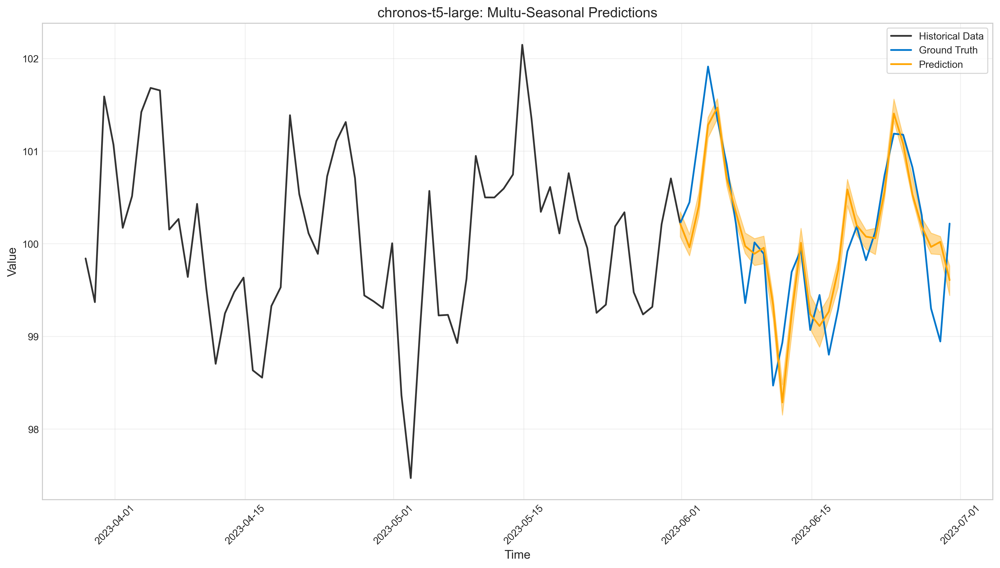

In [10]:
from data.synthetic.financial_patterns import MultiSeasonalGenerator

multiseasonal_gen = MultiSeasonalGenerator(
    seq_length=2000,
    num_samples=1,
    seasons=[5, 20, 60],
    seasonal_amplitudes=[0.005, 0.01, 0.003],
    base_volatility=0.005,
    seed=42,
)
multiseasonal_data = multiseasonal_gen.generate()

multiseasonal_df = convert_synthetic_to_dataframe(multiseasonal_data)

# Select test start date
test_date_str = "2023-06-01"
test_date = pd.Timestamp(test_date_str)
date_indices_multiseasonaldf = multiseasonal_df[multiseasonal_df['Date'] <= test_date].index
test_start = date_indices_multiseasonaldf[-1]

# Run Chronos comparison
multiseasonal_df_chronos_avg, multiseasonal_df_chronos_std, multiseasonal_df_chronos_preds = run_multiple_trials_comparison(
    multiseasonal_df, 
    n_trials=5, 
    test_start=test_start,
    CONTEXT_WINDOW=120,
    FORECAST_STEPS=30
)

print("\nChronos T5 Context Scaling Metrics (Average ± Std):")
for metric in multiseasonal_df_chronos_avg:
    print(f"{metric}: {multiseasonal_df_chronos_avg[metric]:.4f} ± {multiseasonal_df_chronos_std[metric]:.4f}")

plot_forecasts(multiseasonal_df, test_start, multiseasonal_df_chronos_preds, "chronos-t5-large: Multu-Seasonal Predictions", historical_window=64, FORECAST_STEPS=30)

## 4. Long Memory

### 4.1. Description

simulates time series that demonstrate long memory properties, where past returns have a substantial and prolonged impact on future values. This is modeled using a high-persistence autoregressive (AR) process.

### 4.2. Formulation

- **Autoregressive Process (AR(1)):**

  $$
  r_t = \mu + \phi \,(r_{t-1} - \mu) + \epsilon_t,
  $$

  where:
  - $\mu$ is the mean return.
  - $\phi \approx 0.95$ represents high persistence.
  - $\epsilon_t \sim \mathcal{N}(0, \sigma^2)$ is innovation noise.

- **Price Evolution:**

  $$
  P_t = P_{t-1} \times (1 + r_t),
  $$

  ensuring that the autocorrelation in returns translates into the price series.

- **Return Clipping:**

  Clipping is applied (e.g., $\lvert r_t \rvert \le 0.02$) to maintain stability.

### 4.3. Market Behavior Captured

**long memory** characteristic of financial time series, capturing how past shocks may influence future returns over an extended horizon.


Trial 1/5
Context scaling metrics: {'MAE': 2.186800990347808, 'MSE': 7.9551681270275765, 'RMSE': 2.8204907599613893, 'Z-NormalizedMAE': 0.18865217350349736, 'Z-NormalizedMSE': 0.05920446556666407, 'Z-NormalizedRMSE': 0.2433196777218482, 'MAPE': 0.3441010779628134, 'SMAPE': 0.34399430405086645, 'MASE': 0.526468702685347, 'DirectionalAccuracy': 84.0}

Trial 2/5
Context scaling metrics: {'MAE': 2.239492285814356, 'MSE': 7.484593873088358, 'RMSE': 2.7357985805041203, 'Z-NormalizedMAE': 0.19319777571346264, 'Z-NormalizedMSE': 0.055702327488746047, 'Z-NormalizedRMSE': 0.23601340531577028, 'MAPE': 0.3529376424273895, 'SMAPE': 0.3530664607201832, 'MASE': 0.5391540444652003, 'DirectionalAccuracy': 84.0}

Trial 3/5
Context scaling metrics: {'MAE': 2.0208039494925933, 'MSE': 7.58151920606339, 'RMSE': 2.7534558660097295, 'Z-NormalizedMAE': 0.17433184774422267, 'Z-NormalizedMSE': 0.05642367145621815, 'Z-NormalizedRMSE': 0.2375366739184039, 'MAPE': 0.3180568676042333, 'SMAPE': 0.31798972407670223, 

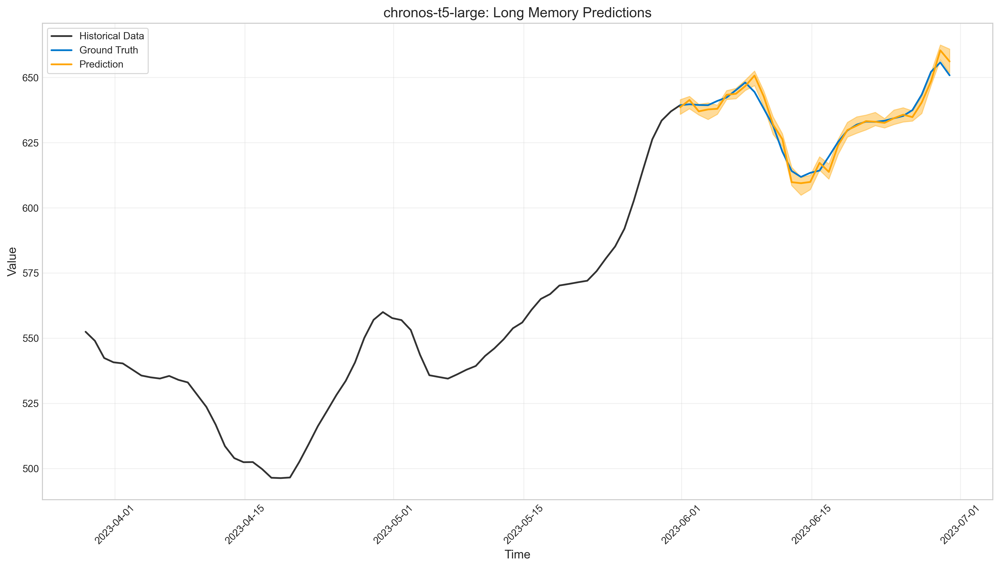

In [11]:
from data.synthetic.financial_patterns import LongMemoryGenerator

longmemory_gen = LongMemoryGenerator(
    seq_length=2000,
    num_samples=1,
    persistence=0.95,
    volatility=0.005,
    mean_return=0.0001,
    seed=42,
)
longmemory_data = longmemory_gen.generate()

longmemory_df = convert_synthetic_to_dataframe(longmemory_data)

# Select test start date
test_date_str = "2023-06-01"
test_date = pd.Timestamp(test_date_str)
date_indices_longmemorydf = longmemory_df[longmemory_df['Date'] <= test_date].index
test_start = date_indices_longmemorydf[-1]

# Run Chronos comparison
longmemory_df_chronos_avg, longmemory_df_chronos_std, longmemory_df_chronos_preds = run_multiple_trials_comparison(
    longmemory_df, 
    n_trials=5, 
    test_start=test_start,
    CONTEXT_WINDOW=120,
    FORECAST_STEPS=30
)

print("\nChronos T5 Context Scaling Metrics (Average ± Std):")
for metric in longmemory_df_chronos_avg:
    print(f"{metric}: {longmemory_df_chronos_avg[metric]:.4f} ± {longmemory_df_chronos_std[metric]:.4f}")

plot_forecasts(longmemory_df, test_start, longmemory_df_chronos_preds, "chronos-t5-large: Long Memory Predictions", historical_window=64, FORECAST_STEPS=30)

# 5. Momentum Mean Reversion

### 5.1. Description

produces a time series that alternates between momentum and mean reversion regimes. In momentum periods, past positive returns tend to persist, while in mean reversion periods, deviations are corrected toward a mean.

### 5.2. Formulation

- **Regime Switching:**

  A binary regime indicator $R_t \in \{0, 1\}$ is established over contiguous blocks, with average duration $L$. Switching can occur after slight random variations around $L$.

- **Return Formulation:**

  - **Momentum Regime** $(R_t = 0)$:
  
    $$
    r_t = \mu + \text{noise} + \gamma_m \,\operatorname{sgn}(r_{t-1}),
    $$
  
  - **Mean Reversion Regime** $(R_t = 1)$:
  
    $$
    r_t = \mu + \text{noise} - \gamma_r \,\operatorname{sgn}(r_{t-1}),
    $$

  where $\gamma_m$ and $\gamma_r$ are the strengths of momentum and reversion effects, respectively. Noise is drawn from a normal distribution with controlled volatility.

- **Price Evolution:**

  $$
  P_t = P_{t-1} \times (1 + r_t),
  $$

  with returns clipped (e.g., $\lvert r_t \rvert \le 0.03$) for stability.

### 5.3. Market Behavior Captured

periods of trending momentum are interspersed with corrective mean reversion, for testing models that must adapt to evolving market conditions.


Trial 1/5
Context scaling metrics: {'MAE': 1.5639305178225602, 'MSE': 3.1340397950188885, 'RMSE': 1.7703219467144637, 'Z-NormalizedMAE': 0.6885029169961443, 'Z-NormalizedMSE': 0.6074089224762554, 'Z-NormalizedRMSE': 0.779364434957264, 'MAPE': 0.9526236784462415, 'SMAPE': 0.9510601226723968, 'MASE': 0.9879054288214918, 'DirectionalAccuracy': 55.172413793103445}

Trial 2/5
Context scaling metrics: {'MAE': 1.6049032773589602, 'MSE': 3.2610754823478683, 'RMSE': 1.805844811258118, 'Z-NormalizedMAE': 0.7065407160778255, 'Z-NormalizedMSE': 0.6320297361874166, 'Z-NormalizedRMSE': 0.7950029787286439, 'MAPE': 0.9771697456168188, 'SMAPE': 0.9760146206721834, 'MASE': 1.0137871487051622, 'DirectionalAccuracy': 55.172413793103445}

Trial 3/5
Context scaling metrics: {'MAE': 1.5832542482913103, 'MSE': 3.217923044783823, 'RMSE': 1.7938570301960586, 'Z-NormalizedMAE': 0.6970099731878128, 'Z-NormalizedMSE': 0.6236663530406361, 'Z-NormalizedRMSE': 0.7897254922063971, 'MAPE': 0.963543461054903, 'SMAPE': 

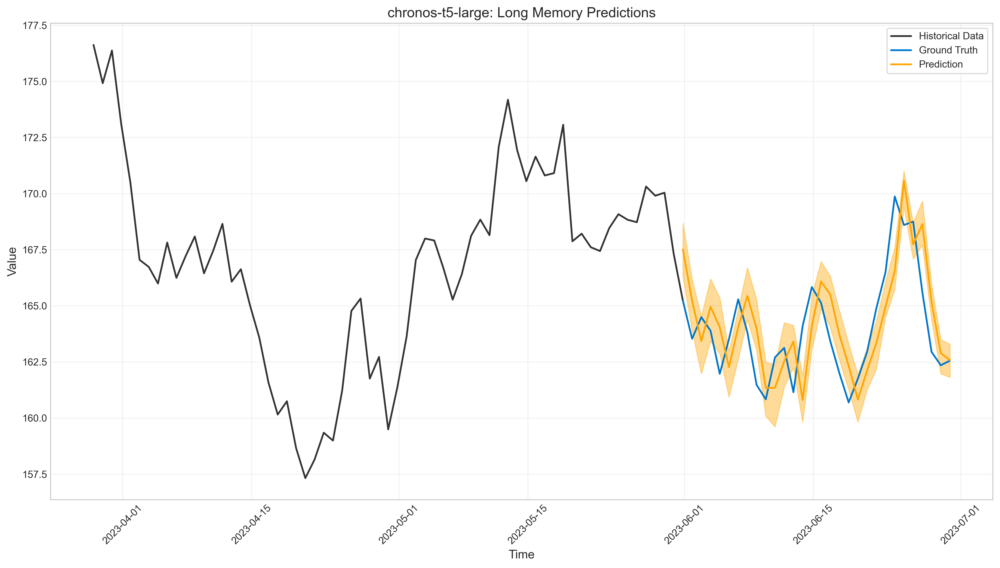

In [13]:
from data.synthetic.financial_patterns import MomentumMeanReversionGenerator

MomentumMeanReversion_gen = MomentumMeanReversionGenerator(
    seq_length=2000,
    num_samples=1,
    regime_duration=30,
    momentum_strength=0.003,
    reversion_strength=0.003,
    volatility=0.01,
    seed=42,
)
MomentumMeanReversion_data = MomentumMeanReversion_gen.generate()

MomentumMeanReversion_df = convert_synthetic_to_dataframe(MomentumMeanReversion_data)

# Select test start date
test_date_str = "2023-06-01"
test_date = pd.Timestamp(test_date_str)
date_indices_MomentumMeanReversiondf = MomentumMeanReversion_df[MomentumMeanReversion_df['Date'] <= test_date].index
test_start = date_indices_MomentumMeanReversiondf[-1]

# Run Chronos comparison
MomentumMeanReversion_df_chronos_avg, MomentumMeanReversion_df_chronos_std, MomentumMeanReversion_df_chronos_preds = run_multiple_trials_comparison(
    MomentumMeanReversion_df, 
    n_trials=5, 
    test_start=test_start,
    CONTEXT_WINDOW=120,
    FORECAST_STEPS=30
)

print("\nChronos T5 Context Scaling Metrics (Average ± Std):")
for metric in MomentumMeanReversion_df_chronos_avg:
    print(f"{metric}: {MomentumMeanReversion_df_chronos_avg[metric]:.4f} ± {MomentumMeanReversion_df_chronos_std[metric]:.4f}")

plot_forecasts(MomentumMeanReversion_df, test_start, MomentumMeanReversion_df_chronos_preds, "chronos-t5-large: Momentum Mean Reversion Predictions", historical_window=64, FORECAST_STEPS=30)

# 6. Market Modeling

### 6.1. Description

a composite model that integrates multiple effects—trend, volatility clustering, jump diffusion, seasonal cycles, and long memory—into a unified framework. It approximates the complex, multifactorial dynamics observed in real financial markets.

### 6.2. Construction and Mathematical Formulation

- **Trend Component:**

  $$
  \text{trend} = d \times (1 + \epsilon_{\text{trend}}),
  $$

  where $d$ is a small drift parameter and $\epsilon_{\text{trend}}$ introduces sample-specific variability.

- **Volatility Clustering:**

  Similar to the Volatility Clustering Generator:

  $$
  \sigma_t = \min\Bigl(\sigma_{\text{cap}}, \; \omega + 0.05 \cdot r_{t-1}^2 + \kappa \,\sigma_{t-1}\Bigr),
  $$

  where $\kappa$ controls the clustering strength, $\sigma_{\text{cap}}$ is a hard cap, and $\omega$ is a base level.

- **Jump Component:**

  With probability $p_j$, the return is adjusted by:

  $$
  r_t \mathrel{+}= J, \quad J \sim \mathcal{N}\Bigl(\mu_J, \sigma_J^2\Bigr).
  $$

- **Seasonal Component:**

  Combined seasonal effects:

  $$
  s(t) = \alpha_1 \sin\Bigl(\frac{2\pi t}{T_1} + \phi_1\Bigr)
       + \alpha_2 \sin\Bigl(\frac{2\pi t}{T_2} + \phi_2\Bigr)
       + \alpha_3 \sin\Bigl(\frac{2\pi t}{T_3} + \phi_3\Bigr).
  $$

- **Long Memory Component:**

  Included via a high-persistence AR(1) term:

  $$
  r_t \mathrel{+}= \lambda \,r_{t-1},
  $$

  where $\lambda \approx 0.9$ provides a long-memory effect.

- **Final Return and Price Evolution:**

  The overall return combines these effects:

  $$
  r_t = \text{trend} + \sqrt{\sigma_t}\,z_t + (\text{jump term}) + s(t) + (\text{long memory term}),
  $$

  with $z_t \sim \mathcal{N}(0,1)$. Finally,

  $$
  P_t = P_{t-1} \times (1 + r_t),
  $$

  where $\lvert r_t \rvert \le 0.03$ is a typical cap used for numerical stability.

### 6.3. Market Behavior Captured

By synthesizing multiple dynamic components, this generator emulates **multifaceted real market dynamics**, including:
- **Deterministic trends,**
- **Volatility clustering,**
- **Sudden jump events,**
- **Periodic seasonal cycles,** and
- **Persistent long memory effects.**

This serves as a challenging environment to test forecasting models’ ability to parse overlapping signals typical of real-world financial markets.



Trial 1/5
Context scaling metrics: {'MAE': 0.6159400302682466, 'MSE': 0.5450421274802344, 'RMSE': 0.7382696847902089, 'Z-NormalizedMAE': 0.5155208163901461, 'Z-NormalizedMSE': 0.381808527624787, 'Z-NormalizedRMSE': 0.6179065686855797, 'MAPE': 0.6890990381318856, 'SMAPE': 0.6883595670417486, 'MASE': 1.0299310215687147, 'DirectionalAccuracy': 47.82608695652174}

Trial 2/5
Context scaling metrics: {'MAE': 0.5513853214264078, 'MSE': 0.48003297243915705, 'RMSE': 0.6928441184271951, 'Z-NormalizedMAE': 0.4614907248738024, 'Z-NormalizedMSE': 0.3362688371734918, 'Z-NormalizedRMSE': 0.5798869175740144, 'MAPE': 0.6170392261195796, 'SMAPE': 0.6162549159329463, 'MASE': 0.9219872381526728, 'DirectionalAccuracy': 56.52173913043478}

Trial 3/5
Context scaling metrics: {'MAE': 0.5985766727243013, 'MSE': 0.5669551966851419, 'RMSE': 0.7529642731797718, 'Z-NormalizedMAE': 0.5009882778044815, 'Z-NormalizedMSE': 0.39715889462769216, 'Z-NormalizedRMSE': 0.6302054384307487, 'MAPE': 0.6695860638012288, 'SMAPE

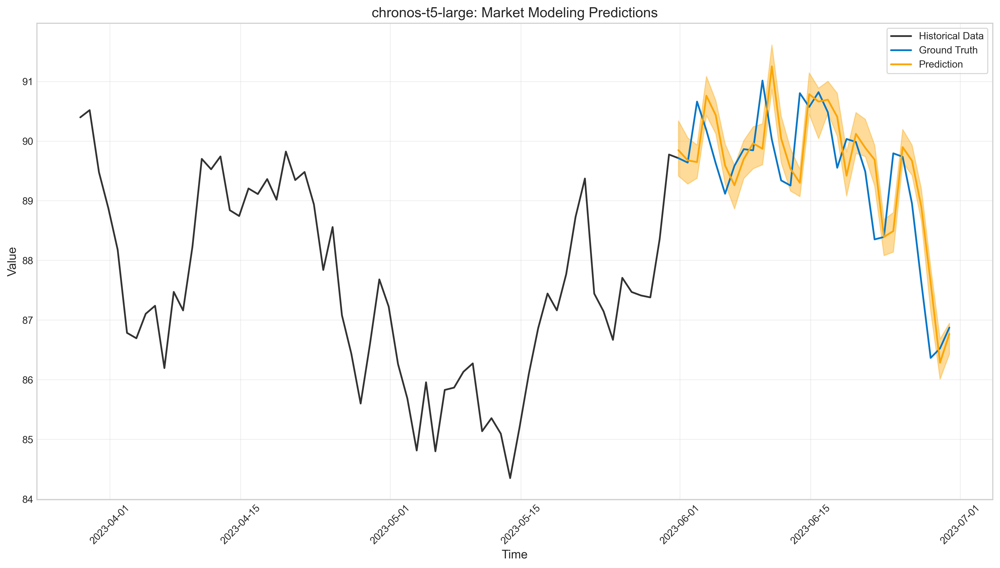

In [14]:
from data.synthetic.financial_patterns import RealisticMarketGenerator

marketmodeling_gen = RealisticMarketGenerator(
    seq_length=2000,
    num_samples=1,
    trend_strength=0.0001,
    vol_cluster_strength=0.8,
    jump_frequency=0.005,
    seasonality_strength=0.005,
    long_memory_strength=0.1,
    seed=42,
)
marketmodeling_data = marketmodeling_gen.generate()

marketmodeling_df = convert_synthetic_to_dataframe(marketmodeling_data)

# Select test start date
test_date_str = "2023-06-01"
test_date = pd.Timestamp(test_date_str)
date_indices_marketmodelingdf = marketmodeling_df[marketmodeling_df['Date'] <= test_date].index
test_start = date_indices_marketmodelingdf[-1]

# Run Chronos comparison
marketmodeling_df_chronos_avg, marketmodeling_df_chronos_std, marketmodeling_df_chronos_preds = run_multiple_trials_comparison(
    marketmodeling_df, 
    n_trials=5, 
    test_start=test_start,
    CONTEXT_WINDOW=120,
    FORECAST_STEPS=30
)

print("\nChronos T5 Context Scaling Metrics (Average ± Std):")
for metric in marketmodeling_df_chronos_avg:
    print(f"{metric}: {marketmodeling_df_chronos_avg[metric]:.4f} ± {marketmodeling_df_chronos_std[metric]:.4f}")

plot_forecasts(marketmodeling_df, test_start, marketmodeling_df_chronos_preds, "chronos-t5-large: Market Modeling Predictions", historical_window=64, FORECAST_STEPS=30)